In [5]:
import pandas as pd 
from rdkit import Chem

data_path = 'NaNs_GS_LF_isomeric_SMILES_dedup_odor_filtered.csv'
df = pd.read_csv(data_path)

id = df['CID']

df = df.drop(columns=['Stimulus', 'CID', 'IUPACName', 'MolecularWeight', 'name'])  
iso_smiles = df['IsomericSMILES'].tolist()
df['smiles'] = [Chem.MolToSmiles(Chem.MolFromSmiles(smiles)) for smiles in iso_smiles]
# Move column 'smiles' to front
df = df[['smiles'] + [col for col in df.columns if col != 'smiles']]
df = df.drop(columns=['IsomericSMILES'])

df

,smiles,bland,chemical,rummy,vetiver,orangeflower,lactonic,jammy,raspberry,minty,...,tomato,cherry,musk,vegetable,grassy,orange,hay,sour,sulfurous,apple
0,COc1ccc(C(C)=O)cc1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,1,0,0,0
1,COc1ccc(C(=O)O)cc1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,1,0,0,0,0,0,0,0,0
2,C=Cc1ccccc1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
3,OCc1ccccc1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
4,O=Cc1ccccc1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5857,CCC1CSSSC1(CC)CC,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
5858,CC(S)SS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,1,0
5859,CCC(C)C(=S)OCC(C)C,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,1,0
5860,CCCCCCCC=COC(=O)CCC,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
df.to_csv('chemprop_gs_lf_filtered.csv', index=False)

## testing making a dictionary with seq_id, seq pairings

In [1]:
import pandas as pd
data_path = 'datasets/M2OR_original_mol_OR_pairs.csv'
df = pd.read_csv(data_path, sep = ';')

id =  df['mol_id'].astype(str) + '-' + df['seq_id'].astype(str)

# For now, generate embeddings ahead of time instead of on the fly since we don't have many unique sequences (1237 mutants)
sequences_dict = df.groupby('seq_id').apply(lambda x: x['mutated_Sequence'].unique()).apply(pd.Series).to_dict()[0]

sequences = sequences_dict.values()



In [2]:
id

0          m_0-s_29
1         m_0-s_449
2         m_0-s_539
3           m_1-s_1
4        m_1-s_1051
            ...    
46558    m_99-s_443
46559    m_99-s_444
46560    m_99-s_449
46561    m_99-s_450
46562     m_99-s_51
Length: 46563, dtype: object

In [3]:
len(sequences)

1237

In [4]:
df.groupby('seq_id').apply(lambda x: x['mutated_Sequence'].unique()).apply(pd.Series).to_dict()[0]


{'s_0': 'MTSRSVCEKMTMTTENPNQTVVSHFFLEGLRYTAKHSSLFFLLFLLIYSITVAGNLLILLTVGSDSHLSLPMYHFLGHLSFLDACLSTVTVPKVMAGLLTLDGKVISFEGCAVQLYCFHFLASTECFLYTVMAYDRYLAICQPLHYPVAMNRRMCAEMAGITWAIGATHAAIHTSLTFRLLYCGPCHIAYFFCDIPPVLKLACTDTTINELVMLASIGIVAAGCLILIVISYIFIVAAVLRIRTAQGRQRAFSPCTAQLTGVLLYYVPPVCIYLQPRSSEAGAGAPAVFYTIVTPMLNPFIYTLRNKEVKHALQRLLCSSFRESTAGSPPP',
 's_1': 'MTEDNYSLTTEFILIGFSDHPDLKILLFLVLSTIYLVTMVGNLGLVALIYMEPRLHTPMYIFLGNLALMDSCCSCAITPKMLENFFSVNRRISLYECMAQFYFLCLAETADCFLLAAMAYDRYVAICNPLQYHTMMSKKLCLQMTTGAYIAGNLHSMIHIGFLFRLIFCRSHVIKHFFCDVLPLYRLSCVDPYINELMILIFSGSVQTFSIIIVLISYFCILFTIFTMKSREGRSKALSTCASHFLSVSIFYGSLLYTYIRPSSINEGNEDIPVAIFYTLVIPLLNPFIYSLRNKEVINAIKRTMNKG',
 's_10': 'MEKTNHSLTTQFILVGFSDHPDLKTPLFLLFSVIYLVTMVGNLGLVAVIYLEPRLHTPMYIFLGNLALMDSCCSCAITPKILENFFSVDRRISLYECMAQFYFLCLAETADCFLLAAMAYDRYVAICNPLQYHSMMSKKLSIQMSIGTFITSNLHSLIHVGCLLRLTFCKSNRIDHFFCDILPLYRLSCTDPFINELMIYIFSMPIQVFTITTVLVSYFCILLTIFKMKSKDGRGKAFSTCASHFFSVSIFYVCLLMYIRPFDEGNKDIPVAVFYTIIIPLLNPFIYSLRNKEVVNAVKKVMKTHSIFKNASASMAR',
 's_100

In [5]:
## Get all values from sequences_dict into a list
sequences = sequences_dict.values()

In [6]:
sequences = list(sequences)

In [7]:
sequences

['MTSRSVCEKMTMTTENPNQTVVSHFFLEGLRYTAKHSSLFFLLFLLIYSITVAGNLLILLTVGSDSHLSLPMYHFLGHLSFLDACLSTVTVPKVMAGLLTLDGKVISFEGCAVQLYCFHFLASTECFLYTVMAYDRYLAICQPLHYPVAMNRRMCAEMAGITWAIGATHAAIHTSLTFRLLYCGPCHIAYFFCDIPPVLKLACTDTTINELVMLASIGIVAAGCLILIVISYIFIVAAVLRIRTAQGRQRAFSPCTAQLTGVLLYYVPPVCIYLQPRSSEAGAGAPAVFYTIVTPMLNPFIYTLRNKEVKHALQRLLCSSFRESTAGSPPP',
 'MTEDNYSLTTEFILIGFSDHPDLKILLFLVLSTIYLVTMVGNLGLVALIYMEPRLHTPMYIFLGNLALMDSCCSCAITPKMLENFFSVNRRISLYECMAQFYFLCLAETADCFLLAAMAYDRYVAICNPLQYHTMMSKKLCLQMTTGAYIAGNLHSMIHIGFLFRLIFCRSHVIKHFFCDVLPLYRLSCVDPYINELMILIFSGSVQTFSIIIVLISYFCILFTIFTMKSREGRSKALSTCASHFLSVSIFYGSLLYTYIRPSSINEGNEDIPVAIFYTLVIPLLNPFIYSLRNKEVINAIKRTMNKG',
 'MEKTNHSLTTQFILVGFSDHPDLKTPLFLLFSVIYLVTMVGNLGLVAVIYLEPRLHTPMYIFLGNLALMDSCCSCAITPKILENFFSVDRRISLYECMAQFYFLCLAETADCFLLAAMAYDRYVAICNPLQYHSMMSKKLSIQMSIGTFITSNLHSLIHVGCLLRLTFCKSNRIDHFFCDILPLYRLSCTDPFINELMIYIFSMPIQVFTITTVLVSYFCILLTIFKMKSKDGRGKAFSTCASHFFSVSIFYVCLLMYIRPFDEGNKDIPVAVFYTIIIPLLNPFIYSLRNKEVVNAVKKVMKTHSIFKNASASMAR',
 'MMVDPNGNESSATYFILIGLPGLEEAQ

In [8]:
dict(zip(sequences_dict.keys(), sequences))

{'s_0': 'MTSRSVCEKMTMTTENPNQTVVSHFFLEGLRYTAKHSSLFFLLFLLIYSITVAGNLLILLTVGSDSHLSLPMYHFLGHLSFLDACLSTVTVPKVMAGLLTLDGKVISFEGCAVQLYCFHFLASTECFLYTVMAYDRYLAICQPLHYPVAMNRRMCAEMAGITWAIGATHAAIHTSLTFRLLYCGPCHIAYFFCDIPPVLKLACTDTTINELVMLASIGIVAAGCLILIVISYIFIVAAVLRIRTAQGRQRAFSPCTAQLTGVLLYYVPPVCIYLQPRSSEAGAGAPAVFYTIVTPMLNPFIYTLRNKEVKHALQRLLCSSFRESTAGSPPP',
 's_1': 'MTEDNYSLTTEFILIGFSDHPDLKILLFLVLSTIYLVTMVGNLGLVALIYMEPRLHTPMYIFLGNLALMDSCCSCAITPKMLENFFSVNRRISLYECMAQFYFLCLAETADCFLLAAMAYDRYVAICNPLQYHTMMSKKLCLQMTTGAYIAGNLHSMIHIGFLFRLIFCRSHVIKHFFCDVLPLYRLSCVDPYINELMILIFSGSVQTFSIIIVLISYFCILFTIFTMKSREGRSKALSTCASHFLSVSIFYGSLLYTYIRPSSINEGNEDIPVAIFYTLVIPLLNPFIYSLRNKEVINAIKRTMNKG',
 's_10': 'MEKTNHSLTTQFILVGFSDHPDLKTPLFLLFSVIYLVTMVGNLGLVAVIYLEPRLHTPMYIFLGNLALMDSCCSCAITPKILENFFSVDRRISLYECMAQFYFLCLAETADCFLLAAMAYDRYVAICNPLQYHSMMSKKLSIQMSIGTFITSNLHSLIHVGCLLRLTFCKSNRIDHFFCDILPLYRLSCTDPFINELMIYIFSMPIQVFTITTVLVSYFCILLTIFKMKSKDGRGKAFSTCASHFFSVSIFYVCLLMYIRPFDEGNKDIPVAVFYTIIIPLLNPFIYSLRNKEVVNAVKKVMKTHSIFKNASASMAR',
 's_100

In [9]:
df

,mol_id,seq_id,Responsive,_DataQuality,num_unique_value_screen,canonicalSMILES,mutated_Sequence
0,m_0,s_29,1,ec50,NaN,CC1=CCC(CC1)C(=C)C,MRENNQSSTLEFILLGVTGQQEQEDFFYILFLFIYPITLIGNLLIV...
1,m_0,s_449,1,ec50,NaN,CC1=CCC(CC1)C(=C)C,MDQSNYSSLHGFILLGFSNHPKMEMILSGVVAIFYLITLVGNTAII...
2,m_0,s_539,0,ec50,NaN,CC1=CCC(CC1)C(=C)C,MDQSNYSSLHGFILLGFSNHPKMEMILSGVVAIFYLITLVGNTAII...
3,m_1,s_1,1,ec50,NaN,CC1=CCC(CC1=O)C(=C)C,MTEDNYSLTTEFILIGFSDHPDLKILLFLVLSTIYLVTMVGNLGLV...
4,m_1,s_1051,0,ec50,NaN,CC1=CCC(CC1=O)C(=C)C,MREENESSTTDFTLLGVTRQREQEYFFFILFLFIYPITVFGNMLII...
...,...,...,...,...,...,...,...
46558,m_99,s_443,1,secondaryScreening,4.0,C1=CC=C(C=C1)OC2=CC=CC=C2,MRENNQSSTLEFILLGVTGQQEQEDFFYILFLFIYPITLIGNLLIV...
46559,m_99,s_444,0,secondaryScreening,4.0,C1=CC=C(C=C1)OC2=CC=CC=C2,MRENNQSSTLEFILLGVTGQQEQEDFFYILFLFIYPITLIGNLLIV...
46560,m_99,s_449,0,secondaryScreening,4.0,C1=CC=C(C=C1)OC2=CC=CC=C2,MDQSNYSSLHGFILLGFSNHPKMEMILSGVVAIFYLITLVGNTAII...
46561,m_99,s_450,0,secondaryScreening,4.0,C1=CC=C(C=C1)OC2=CC=CC=C2,MDEANHSVVSEFVFLGLSDSRKIQLLLFLFFSVFYVSSLMGNLLIV...


In [10]:
df['smiles'] = df['canonicalSMILES']
df = df.drop(columns={'mol_id', 'seq_id', '_DataQuality', 'num_unique_value_screen', 'mutated_Sequence'})
df

,Responsive,canonicalSMILES,smiles
0,1,CC1=CCC(CC1)C(=C)C,CC1=CCC(CC1)C(=C)C
1,1,CC1=CCC(CC1)C(=C)C,CC1=CCC(CC1)C(=C)C
2,0,CC1=CCC(CC1)C(=C)C,CC1=CCC(CC1)C(=C)C
3,1,CC1=CCC(CC1=O)C(=C)C,CC1=CCC(CC1=O)C(=C)C
4,0,CC1=CCC(CC1=O)C(=C)C,CC1=CCC(CC1=O)C(=C)C
...,...,...,...
46558,1,C1=CC=C(C=C1)OC2=CC=CC=C2,C1=CC=C(C=C1)OC2=CC=CC=C2
46559,0,C1=CC=C(C=C1)OC2=CC=CC=C2,C1=CC=C(C=C1)OC2=CC=CC=C2
46560,0,C1=CC=C(C=C1)OC2=CC=CC=C2,C1=CC=C(C=C1)OC2=CC=CC=C2
46561,0,C1=CC=C(C=C1)OC2=CC=CC=C2,C1=CC=C(C=C1)OC2=CC=CC=C2


In [11]:
df = df[['smiles', 'Responsive']]
df

,smiles,Responsive
0,CC1=CCC(CC1)C(=C)C,1
1,CC1=CCC(CC1)C(=C)C,1
2,CC1=CCC(CC1)C(=C)C,0
3,CC1=CCC(CC1=O)C(=C)C,1
4,CC1=CCC(CC1=O)C(=C)C,0
...,...,...
46558,C1=CC=C(C=C1)OC2=CC=CC=C2,1
46559,C1=CC=C(C=C1)OC2=CC=CC=C2,0
46560,C1=CC=C(C=C1)OC2=CC=CC=C2,0
46561,C1=CC=C(C=C1)OC2=CC=CC=C2,0


In [1]:
from m2or import M2OR_Pairs
from dgllife.utils import SMILESToBigraph
from dgllife.utils import CanonicalAtomFeaturizer
from dgllife.utils import SMILESToBigraph


smiles_to_g = SMILESToBigraph(add_self_loop=True, node_featurizer=CanonicalAtomFeaturizer(),
                                edge_featurizer=None)    


dataset = M2OR_Pairs(smiles_to_graph=smiles_to_g, 
        n_jobs=1)

loading esm model...
done loading esm model
0          s_29
1         s_449
2         s_539
3           s_1
4        s_1051
          ...  
46558     s_443
46559     s_444
46560     s_449
46561     s_450
46562      s_51
Name: seq_id, Length: 46563, dtype: object
Processing dgl graphs from scratch...
Processing molecule 1000/46563
Processing molecule 2000/46563
Processing molecule 3000/46563
Processing molecule 4000/46563
Processing molecule 5000/46563
Processing molecule 6000/46563
Processing molecule 7000/46563
Processing molecule 8000/46563
Processing molecule 9000/46563
Processing molecule 10000/46563
Processing molecule 11000/46563
Processing molecule 12000/46563
Processing molecule 13000/46563
Processing molecule 14000/46563
Processing molecule 15000/46563
Processing molecule 16000/46563
Processing molecule 17000/46563
Processing molecule 18000/46563
Processing molecule 19000/46563
Processing molecule 20000/46563
Processing molecule 21000/46563
Processing molecule 22000/46563
Proc

In [15]:
dataset.seq_id[3034]

's_1118'

In [17]:
dataset.load_full = True

dataset.seq_embeddings_dict[dataset.seq_id[3034]].shape

(1280,)

In [18]:
from dgllife.utils import ScaffoldSplitter, RandomSplitter

train_set, val_set, test_set = RandomSplitter.train_val_test_split(
    dataset, frac_train=0.8, frac_val=0.1, frac_test=0.1, random_state = 42)


In [19]:
def collate_molgraphs(data):
    """Batching a list of datapoints for dataloader.

    Parameters
    ----------
    data : list of 3-tuples or 4-tuples.
        Each tuple is for a single datapoint, consisting of
        a SMILES, a DGLGraph, all-task labels and optionally a binary
        mask indicating the existence of labels.

    Returns
    -------
    smiles : list
        List of smiles
    bg : DGLGraph
        The batched DGLGraph.
    labels : Tensor of dtype float32 and shape (B, T)
        Batched datapoint labels. B is len(data) and
        T is the number of total tasks.
    masks : Tensor of dtype float32 and shape (B, T)
        Batched datapoint binary mask, indicating the
        existence of labels.
    """
    ids, seq_ids, sequences_dict, seq_embeddings = None, None, None, None
    if len(data[0]) == 3:
        smiles, graphs, labels = map(list, zip(*data))
    elif len(data[0]) == 8:
        smiles, graphs, labels, masks, ids, seq_ids, sequences_dict, seq_embeddings = map(list, zip(*data))
    else:
        smiles, graphs, labels, masks = map(list, zip(*data))

    bg = dgl.batch(graphs)
    bg.set_n_initializer(dgl.init.zero_initializer)
    bg.set_e_initializer(dgl.init.zero_initializer)
    labels = torch.stack(labels, dim=0)

    if len(data[0]) == 3:
        masks = torch.ones(labels.shape)
    else:
        masks = torch.stack(masks, dim=0)
    
    if len(data[0]) == 8:
        return smiles, bg, labels, masks, ids, seq_ids, sequences_dict, seq_embeddings
    
    return smiles, bg, labels, masks


In [20]:
from torch.utils.data import DataLoader


train_loader = DataLoader(dataset=train_set, batch_size=64, shuffle=True,
                            collate_fn=collate_molgraphs, num_workers=1)



In [21]:
train_loader

In [26]:
import dgl
import torch
for batch_id, batch_data in enumerate(train_loader):
    print(batch_id)
    print(batch_data)

0
(['CC1=CC(=C(C=C1)O)OC', 'CCCCCC(C)O', 'CCCCCCC=CC=O', 'CC(=O)OC1CC2CCC1(C2(C)C)C', 'CCCCCCCCCC=O', 'CC(C)C=O', 'CC(=O)OC1CC2CCC1(C2(C)C)C', 'CC(C)C=O', 'CC(=CCCC(C)(C=C)O)C', 'CCCCCCCCC=O', 'CC1(C2CCC(C2)(C1=O)C)C', 'CCCCCOC(=O)C', 'CC(CCC=C(C)C)CC=O', 'C1=CN=CC=N1', 'CCCCCCCC=O', 'CC(C)CC(=O)O', 'CCCCCCC=CCCC=O', 'CCCCCCCC(=O)C', 'CC12CCC3C(C1CC=C2)CCC4C3(CCC(=O)C4)C', 'CS', 'CCCCCCCC=O', 'C=CCOC(=O)CC1=CC=CC=C1', 'CCCCCCCC=O', 'CSSSC', 'CC1CCC(C(C1)O)C(C)C', 'CC=CC1=CC=C(C=C1)OC', 'CNC1=CC=CC=C1C(=O)OC', 'CC(CC1=CC2=C(C=C1)OCO2)C=O', 'CCCCOC(=O)C(C)OC(=O)CCC', 'COC1=C(C=C(C=C1)CC=C)OC', 'COC1=C(C=CC(=C1)C=O)O', 'CCCCCC=O', 'CC1=CC=C(C=C1)C(C)C', 'COC1=CC=CC=C1O', 'CC1C(=O)C(=C(O1)C)O', 'COC1=C(C=CC(=C1)C=O)O', 'CC1C(=O)C(=C(O1)C)O', 'CC1=C(C=CO1)SSC2=C(OC=C2)C', 'CCCCCCCC=O', 'CC(CC1=CC2=C(C=C1)OCO2)C=O', 'CCCCO', 'CC1(C2CCC(O1)(CC2)C)C', 'CCC=CCCO', 'CC1=C(C(=CC=C1)C)O', 'CCCCC(=O)CC', 'CC1=C(C(=C(C(=C1[N+](=O)[O-])C(C)(C)C)[N+](=O)[O-])C)[N+](=O)[O-]', 'CC=CC1=CC(=C(C=C1)O)OC', 

KeyboardInterrupt: 

In [30]:
smiles, bg, labels, masks, ids, seq_ids, sequences_dict, seq_embeddings = batch_data


In [33]:
type(seq_embeddings[0])

numpy.ndarray

In [37]:
import numpy as np
seq_emb_arr = np.vstack(seq_embeddings)
seq_embeddings_tensor = torch.FloatTensor(seq_emb_arr).cuda()
print (seq_embeddings_tensor.shape)


torch.Size([64, 1280])


In [38]:
seq_embeddings_tensor

tensor([[ 0.0273, -0.0253, -0.0334,  ..., -0.0463, -0.1203, -0.0581],
        [-0.0455, -0.0414, -0.0917,  ..., -0.1665, -0.0864, -0.0017],
        [-0.0048, -0.0108, -0.0646,  ..., -0.0690, -0.1162, -0.0570],
        ...,
        [ 0.0018, -0.0018, -0.0577,  ..., -0.0852, -0.1427, -0.0005],
        [-0.0118, -0.0235, -0.0739,  ..., -0.0688, -0.1413, -0.0588],
        [-0.0474, -0.0226, -0.0880,  ..., -0.1434, -0.1150,  0.0201]],
       device='cuda:0')

In [3]:
import torch

x = torch.randn(2, 3)
torch.cat((x, None), dim=1)

TypeError: expected Tensor as element 1 in argument 0, but got NoneType

### Looking at data quality distribution, # of unique sequences by screening type, etc

In [121]:
import pandas as pd
data_path = 'data/datasets/M2OR_original_mol_OR_pairs.csv'
df = pd.read_csv(data_path, sep = ';')
df

,mol_id,seq_id,Responsive,_DataQuality,num_unique_value_screen,canonicalSMILES,mutated_Sequence
0,m_0,s_29,1,ec50,NaN,CC1=CCC(CC1)C(=C)C,MRENNQSSTLEFILLGVTGQQEQEDFFYILFLFIYPITLIGNLLIV...
1,m_0,s_449,1,ec50,NaN,CC1=CCC(CC1)C(=C)C,MDQSNYSSLHGFILLGFSNHPKMEMILSGVVAIFYLITLVGNTAII...
2,m_0,s_539,0,ec50,NaN,CC1=CCC(CC1)C(=C)C,MDQSNYSSLHGFILLGFSNHPKMEMILSGVVAIFYLITLVGNTAII...
3,m_1,s_1,1,ec50,NaN,CC1=CCC(CC1=O)C(=C)C,MTEDNYSLTTEFILIGFSDHPDLKILLFLVLSTIYLVTMVGNLGLV...
4,m_1,s_1051,0,ec50,NaN,CC1=CCC(CC1=O)C(=C)C,MREENESSTTDFTLLGVTRQREQEYFFFILFLFIYPITVFGNMLII...
...,...,...,...,...,...,...,...
46558,m_99,s_443,1,secondaryScreening,4.0,C1=CC=C(C=C1)OC2=CC=CC=C2,MRENNQSSTLEFILLGVTGQQEQEDFFYILFLFIYPITLIGNLLIV...
46559,m_99,s_444,0,secondaryScreening,4.0,C1=CC=C(C=C1)OC2=CC=CC=C2,MRENNQSSTLEFILLGVTGQQEQEDFFYILFLFIYPITLIGNLLIV...
46560,m_99,s_449,0,secondaryScreening,4.0,C1=CC=C(C=C1)OC2=CC=CC=C2,MDQSNYSSLHGFILLGFSNHPKMEMILSGVVAIFYLITLVGNTAII...
46561,m_99,s_450,0,secondaryScreening,4.0,C1=CC=C(C=C1)OC2=CC=CC=C2,MDEANHSVVSEFVFLGLSDSRKIQLLLFLFFSVFYVSSLMGNLLIV...


In [124]:
df[df['_DataQuality'] == 'ec50']['seq_id'].unique().shape

(449,)

In [3]:
df[df['_DataQuality'] == 'primaryScreening']['seq_id'].unique().shape

(964,)

In [4]:
df[df['_DataQuality'] == 'secondaryScreening']['seq_id'].unique().shape

(646,)

In [1]:
from data.m2or import M2OR_Pairs
from dgllife.utils import SMILESToBigraph
from dgllife.utils import CanonicalAtomFeaturizer
from dgllife.utils import SMILESToBigraph


smiles_to_g = SMILESToBigraph(add_self_loop=True, node_featurizer=CanonicalAtomFeaturizer(),
                                edge_featurizer=None)    


dataset = M2OR_Pairs(smiles_to_graph=smiles_to_g, 
        n_jobs=1)

loading esm model...
done loading esm model
Processing dgl graphs from scratch...
Processing molecule 1000/46563
Processing molecule 2000/46563
Processing molecule 3000/46563
Processing molecule 4000/46563
Processing molecule 5000/46563
Processing molecule 6000/46563
Processing molecule 7000/46563
Processing molecule 8000/46563
Processing molecule 9000/46563
Processing molecule 10000/46563
Processing molecule 11000/46563
Processing molecule 12000/46563
Processing molecule 13000/46563
Processing molecule 14000/46563
Processing molecule 15000/46563
Processing molecule 16000/46563
Processing molecule 17000/46563
Processing molecule 18000/46563
Processing molecule 19000/46563
Processing molecule 20000/46563
Processing molecule 21000/46563
Processing molecule 22000/46563
Processing molecule 23000/46563
Processing molecule 24000/46563
Processing molecule 25000/46563
Processing molecule 26000/46563
Processing molecule 27000/46563
Processing molecule 28000/46563
Processing molecule 29000/46563

In [2]:
from utils import split_dataset
from dgllife.utils import ScaffoldSplitter, RandomSplitter
train_ratio, val_ratio, test_ratio = 0.8, 0.1, 0.1
train_set, val_set, test_set = ScaffoldSplitter.train_val_test_split(
    dataset, frac_train=train_ratio, frac_val=val_ratio, frac_test=test_ratio,
    scaffold_func='smiles')


Start initializing RDKit molecule instances...
Creating RDKit molecule instance 1000/46563
Creating RDKit molecule instance 2000/46563
Creating RDKit molecule instance 3000/46563
Creating RDKit molecule instance 4000/46563
Creating RDKit molecule instance 5000/46563
Creating RDKit molecule instance 6000/46563
Creating RDKit molecule instance 7000/46563
Creating RDKit molecule instance 8000/46563
Creating RDKit molecule instance 9000/46563
Creating RDKit molecule instance 10000/46563
Creating RDKit molecule instance 11000/46563
Creating RDKit molecule instance 12000/46563
Creating RDKit molecule instance 13000/46563
Creating RDKit molecule instance 14000/46563
Creating RDKit molecule instance 15000/46563
Creating RDKit molecule instance 16000/46563
Creating RDKit molecule instance 17000/46563
Creating RDKit molecule instance 18000/46563
Creating RDKit molecule instance 19000/46563
Creating RDKit molecule instance 20000/46563
Creating RDKit molecule instance 21000/46563
Creating RDKit mo

In [3]:
train_set.indices

[244,
 245,
 246,
 247,
 248,
 249,
 250,
 251,
 252,
 253,
 254,
 255,
 256,
 257,
 258,
 259,
 260,
 261,
 262,
 263,
 264,
 265,
 266,
 267,
 268,
 269,
 271,
 272,
 273,
 274,
 275,
 276,
 357,
 358,
 359,
 360,
 361,
 362,
 363,
 364,
 365,
 366,
 367,
 368,
 369,
 370,
 371,
 372,
 373,
 374,
 375,
 376,
 377,
 378,
 379,
 380,
 381,
 382,
 383,
 384,
 385,
 386,
 387,
 388,
 389,
 390,
 391,
 392,
 393,
 394,
 395,
 396,
 397,
 398,
 399,
 400,
 401,
 402,
 403,
 404,
 405,
 406,
 407,
 408,
 409,
 410,
 411,
 412,
 413,
 414,
 415,
 416,
 417,
 418,
 419,
 420,
 422,
 423,
 424,
 464,
 465,
 466,
 467,
 468,
 469,
 470,
 471,
 472,
 473,
 474,
 475,
 476,
 477,
 478,
 479,
 480,
 481,
 482,
 483,
 484,
 485,
 486,
 487,
 488,
 489,
 490,
 491,
 492,
 493,
 494,
 495,
 496,
 497,
 498,
 499,
 500,
 501,
 502,
 503,
 504,
 505,
 506,
 507,
 508,
 509,
 510,
 511,
 512,
 513,
 514,
 515,
 516,
 517,
 518,
 519,
 520,
 521,
 522,
 523,
 524,
 525,
 527,
 528,
 529,
 530,
 531,
 532

In [4]:
train_seqs = [train_set.dataset.sequences_dict[item] for item in train_set.dataset.seq_id[train_set.indices]]
val_seqs = [val_set.dataset.sequences_dict[item] for item in val_set.dataset.seq_id[val_set.indices]]
test_seqs = [test_set.dataset.sequences_dict[item] for item in test_set.dataset.seq_id[test_set.indices]]

In [6]:
train_data_quality = train_set.dataset.data_quality[train_set.indices]
val_data_quality = val_set.dataset.data_quality[val_set.indices]
test_data_quality = test_set.dataset.data_quality[test_set.indices]

In [12]:
train_data_quality.value_counts(), val_data_quality.value_counts(), test_data_quality.value_counts()

(_DataQuality
 primaryScreening      26635
 secondaryScreening     6474
 ec50                   4141
 Name: count, dtype: int64,
 _DataQuality
 primaryScreening      4073
 secondaryScreening     456
 ec50                   441
 Name: count, dtype: int64,
 _DataQuality
 primaryScreening      2482
 secondaryScreening    1228
 ec50                   633
 Name: count, dtype: int64)

In [5]:
## get ## of unique strings in list of strings
len(set(train_seqs)), len(set(val_seqs)), len(set(test_seqs))

(1153, 971, 887)

In [13]:
## Try random splitter

from dgllife.utils import ScaffoldSplitter, RandomSplitter

train_set, val_set, test_set = RandomSplitter.train_val_test_split(
    dataset, frac_train=0.8, frac_val=0.1, frac_test=0.1, random_state = 42)


In [15]:
train_seqs = [train_set.dataset.sequences_dict[item] for item in train_set.dataset.seq_id[train_set.indices]]
val_seqs = [val_set.dataset.sequences_dict[item] for item in val_set.dataset.seq_id[val_set.indices]]
test_seqs = [test_set.dataset.sequences_dict[item] for item in test_set.dataset.seq_id[test_set.indices]]

In [16]:
len(set(train_seqs)), len(set(val_seqs)), len(set(test_seqs))

(1205, 902, 909)

In [18]:
import pandas as pd
data_path = 'data/datasets/M2OR_original_mol_OR_pairs.csv'
df = pd.read_csv(data_path, sep = ';')
df

,mol_id,seq_id,Responsive,_DataQuality,num_unique_value_screen,canonicalSMILES,mutated_Sequence
0,m_0,s_29,1,ec50,NaN,CC1=CCC(CC1)C(=C)C,MRENNQSSTLEFILLGVTGQQEQEDFFYILFLFIYPITLIGNLLIV...
1,m_0,s_449,1,ec50,NaN,CC1=CCC(CC1)C(=C)C,MDQSNYSSLHGFILLGFSNHPKMEMILSGVVAIFYLITLVGNTAII...
2,m_0,s_539,0,ec50,NaN,CC1=CCC(CC1)C(=C)C,MDQSNYSSLHGFILLGFSNHPKMEMILSGVVAIFYLITLVGNTAII...
3,m_1,s_1,1,ec50,NaN,CC1=CCC(CC1=O)C(=C)C,MTEDNYSLTTEFILIGFSDHPDLKILLFLVLSTIYLVTMVGNLGLV...
4,m_1,s_1051,0,ec50,NaN,CC1=CCC(CC1=O)C(=C)C,MREENESSTTDFTLLGVTRQREQEYFFFILFLFIYPITVFGNMLII...
...,...,...,...,...,...,...,...
46558,m_99,s_443,1,secondaryScreening,4.0,C1=CC=C(C=C1)OC2=CC=CC=C2,MRENNQSSTLEFILLGVTGQQEQEDFFYILFLFIYPITLIGNLLIV...
46559,m_99,s_444,0,secondaryScreening,4.0,C1=CC=C(C=C1)OC2=CC=CC=C2,MRENNQSSTLEFILLGVTGQQEQEDFFYILFLFIYPITLIGNLLIV...
46560,m_99,s_449,0,secondaryScreening,4.0,C1=CC=C(C=C1)OC2=CC=CC=C2,MDQSNYSSLHGFILLGFSNHPKMEMILSGVVAIFYLITLVGNTAII...
46561,m_99,s_450,0,secondaryScreening,4.0,C1=CC=C(C=C1)OC2=CC=CC=C2,MDEANHSVVSEFVFLGLSDSRKIQLLLFLFFSVFYVSSLMGNLLIV...


In [19]:
## Using Mainland et. al (2015) data for primary, secondary, and tertiary screening, with the conditional probabilities for each
## positive or negative primary/secondary screen being truly positive or negative in the tertiary screen to reweigh loss

for i in range(len(df)):
    if df.loc [i, '_DataQuality'] == 'ec50':
        df.loc[i, 'weight_quality'] = 1
    elif df.loc[i, '_DataQuality'] == 'primaryScreening':
        if df.loc[i, 'Responsive'] == 1:
            df.loc[i, 'weight_quality'] = 0.4
        else:
            df.loc[i, 'weight_quality'] = 0.69
    elif df.loc[i, '_DataQuality'] == 'secondaryScreening':
        if df.loc[i, 'Responsive'] == 1:
            df.loc[i, 'weight_quality'] = 0.72
        else:
            df.loc[i, 'weight_quality'] = 0.77


In [20]:
df

,mol_id,seq_id,Responsive,_DataQuality,num_unique_value_screen,canonicalSMILES,mutated_Sequence,weight_quality
0,m_0,s_29,1,ec50,NaN,CC1=CCC(CC1)C(=C)C,MRENNQSSTLEFILLGVTGQQEQEDFFYILFLFIYPITLIGNLLIV...,1.00
1,m_0,s_449,1,ec50,NaN,CC1=CCC(CC1)C(=C)C,MDQSNYSSLHGFILLGFSNHPKMEMILSGVVAIFYLITLVGNTAII...,1.00
2,m_0,s_539,0,ec50,NaN,CC1=CCC(CC1)C(=C)C,MDQSNYSSLHGFILLGFSNHPKMEMILSGVVAIFYLITLVGNTAII...,1.00
3,m_1,s_1,1,ec50,NaN,CC1=CCC(CC1=O)C(=C)C,MTEDNYSLTTEFILIGFSDHPDLKILLFLVLSTIYLVTMVGNLGLV...,1.00
4,m_1,s_1051,0,ec50,NaN,CC1=CCC(CC1=O)C(=C)C,MREENESSTTDFTLLGVTRQREQEYFFFILFLFIYPITVFGNMLII...,1.00
...,...,...,...,...,...,...,...,...
46558,m_99,s_443,1,secondaryScreening,4.0,C1=CC=C(C=C1)OC2=CC=CC=C2,MRENNQSSTLEFILLGVTGQQEQEDFFYILFLFIYPITLIGNLLIV...,0.72
46559,m_99,s_444,0,secondaryScreening,4.0,C1=CC=C(C=C1)OC2=CC=CC=C2,MRENNQSSTLEFILLGVTGQQEQEDFFYILFLFIYPITLIGNLLIV...,0.77
46560,m_99,s_449,0,secondaryScreening,4.0,C1=CC=C(C=C1)OC2=CC=CC=C2,MDQSNYSSLHGFILLGFSNHPKMEMILSGVVAIFYLITLVGNTAII...,0.77
46561,m_99,s_450,0,secondaryScreening,4.0,C1=CC=C(C=C1)OC2=CC=CC=C2,MDEANHSVVSEFVFLGLSDSRKIQLLLFLFFSVFYVSSLMGNLLIV...,0.77


In [26]:
## Class weight balancing
pos_weight = df['Responsive'].value_counts()[0] / df['Responsive'].value_counts()[1]

for i in range(len(df)):
    if df.loc [i, 'Responsive'] == 1:
        df.loc[i, 'weight_class'] = pos_weight
    else:
        df.loc[i, 'weight_class'] = 1
df

,mol_id,seq_id,Responsive,_DataQuality,num_unique_value_screen,canonicalSMILES,mutated_Sequence,weight_quality,weight_class
0,m_0,s_29,1,ec50,NaN,CC1=CCC(CC1)C(=C)C,MRENNQSSTLEFILLGVTGQQEQEDFFYILFLFIYPITLIGNLLIV...,1.00,15.056207
1,m_0,s_449,1,ec50,NaN,CC1=CCC(CC1)C(=C)C,MDQSNYSSLHGFILLGFSNHPKMEMILSGVVAIFYLITLVGNTAII...,1.00,15.056207
2,m_0,s_539,0,ec50,NaN,CC1=CCC(CC1)C(=C)C,MDQSNYSSLHGFILLGFSNHPKMEMILSGVVAIFYLITLVGNTAII...,1.00,1.000000
3,m_1,s_1,1,ec50,NaN,CC1=CCC(CC1=O)C(=C)C,MTEDNYSLTTEFILIGFSDHPDLKILLFLVLSTIYLVTMVGNLGLV...,1.00,15.056207
4,m_1,s_1051,0,ec50,NaN,CC1=CCC(CC1=O)C(=C)C,MREENESSTTDFTLLGVTRQREQEYFFFILFLFIYPITVFGNMLII...,1.00,1.000000
...,...,...,...,...,...,...,...,...,...
46558,m_99,s_443,1,secondaryScreening,4.0,C1=CC=C(C=C1)OC2=CC=CC=C2,MRENNQSSTLEFILLGVTGQQEQEDFFYILFLFIYPITLIGNLLIV...,0.72,15.056207
46559,m_99,s_444,0,secondaryScreening,4.0,C1=CC=C(C=C1)OC2=CC=CC=C2,MRENNQSSTLEFILLGVTGQQEQEDFFYILFLFIYPITLIGNLLIV...,0.77,1.000000
46560,m_99,s_449,0,secondaryScreening,4.0,C1=CC=C(C=C1)OC2=CC=CC=C2,MDQSNYSSLHGFILLGFSNHPKMEMILSGVVAIFYLITLVGNTAII...,0.77,1.000000
46561,m_99,s_450,0,secondaryScreening,4.0,C1=CC=C(C=C1)OC2=CC=CC=C2,MDEANHSVVSEFVFLGLSDSRKIQLLLFLFFSVFYVSSLMGNLLIV...,0.77,1.000000


In [38]:
df[df['seq_id'] == 's_333']['mol_id'].unique().shape[0] == df[df['seq_id'] == 's_333']['mol_id'].shape[0]

True

In [39]:
df[df['mol_id'] == 'm_333']['seq_id'].unique().shape[0] == df[df['mol_id'] == 'm_333']['seq_id'].shape[0]

True

In [41]:
## Pair imbalance
import numpy as np
k = 50
for i in range(len(df)):
    curr_receptor = df.iloc[i]['seq_id']
    curr_mol = df.iloc[i]['mol_id']
    num_mols = df[df['seq_id'] == curr_receptor]['mol_id'].shape[0]
    num_receptors = df[df['mol_id'] == curr_mol]['seq_id'].shape[0]
    
    df.loc[i, 'weight_pair_imbalance'] = np.log(1 + k/2 * (1/num_mols + 1/num_receptors))

df['weight_pair_imbalance'] = df['weight_pair_imbalance'].astype(float)

In [42]:
df

,mol_id,seq_id,Responsive,_DataQuality,num_unique_value_screen,canonicalSMILES,mutated_Sequence,weight_quality,weight_class,weight_pair_imbalance
0,m_0,s_29,1,ec50,NaN,CC1=CCC(CC1)C(=C)C,MRENNQSSTLEFILLGVTGQQEQEDFFYILFLFIYPITLIGNLLIV...,1.00,15.056207,1.009884
1,m_0,s_449,1,ec50,NaN,CC1=CCC(CC1)C(=C)C,MDQSNYSSLHGFILLGFSNHPKMEMILSGVVAIFYLITLVGNTAII...,1.00,15.056207,1.044329
2,m_0,s_539,0,ec50,NaN,CC1=CCC(CC1)C(=C)C,MDQSNYSSLHGFILLGFSNHPKMEMILSGVVAIFYLITLVGNTAII...,1.00,1.000000,1.073089
3,m_1,s_1,1,ec50,NaN,CC1=CCC(CC1=O)C(=C)C,MTEDNYSLTTEFILIGFSDHPDLKILLFLVLSTIYLVTMVGNLGLV...,1.00,15.056207,0.380514
4,m_1,s_1051,0,ec50,NaN,CC1=CCC(CC1=O)C(=C)C,MREENESSTTDFTLLGVTRQREQEYFFFILFLFIYPITVFGNMLII...,1.00,1.000000,2.251529
...,...,...,...,...,...,...,...,...,...,...
46558,m_99,s_443,1,secondaryScreening,4.0,C1=CC=C(C=C1)OC2=CC=CC=C2,MRENNQSSTLEFILLGVTGQQEQEDFFYILFLFIYPITLIGNLLIV...,0.72,15.056207,0.401231
46559,m_99,s_444,0,secondaryScreening,4.0,C1=CC=C(C=C1)OC2=CC=CC=C2,MRENNQSSTLEFILLGVTGQQEQEDFFYILFLFIYPITLIGNLLIV...,0.77,1.000000,0.411852
46560,m_99,s_449,0,secondaryScreening,4.0,C1=CC=C(C=C1)OC2=CC=CC=C2,MDQSNYSSLHGFILLGFSNHPKMEMILSGVVAIFYLITLVGNTAII...,0.77,1.000000,0.206926
46561,m_99,s_450,0,secondaryScreening,4.0,C1=CC=C(C=C1)OC2=CC=CC=C2,MDEANHSVVSEFVFLGLSDSRKIQLLLFLFFSVFYVSSLMGNLLIV...,0.77,1.000000,0.341587


In [43]:
for i in range(len(df)):
    df.loc[i, 'sample_weight'] = df.iloc[i]['weight_quality'] * df.iloc[i]['weight_class'] * df.iloc[i]['weight_pair_imbalance']

df

,mol_id,seq_id,Responsive,_DataQuality,num_unique_value_screen,canonicalSMILES,mutated_Sequence,weight_quality,weight_class,weight_pair_imbalance,sample_weight
0,m_0,s_29,1,ec50,NaN,CC1=CCC(CC1)C(=C)C,MRENNQSSTLEFILLGVTGQQEQEDFFYILFLFIYPITLIGNLLIV...,1.00,15.056207,1.009884,15.205025
1,m_0,s_449,1,ec50,NaN,CC1=CCC(CC1)C(=C)C,MDQSNYSSLHGFILLGFSNHPKMEMILSGVVAIFYLITLVGNTAII...,1.00,15.056207,1.044329,15.723637
2,m_0,s_539,0,ec50,NaN,CC1=CCC(CC1)C(=C)C,MDQSNYSSLHGFILLGFSNHPKMEMILSGVVAIFYLITLVGNTAII...,1.00,1.000000,1.073089,1.073089
3,m_1,s_1,1,ec50,NaN,CC1=CCC(CC1=O)C(=C)C,MTEDNYSLTTEFILIGFSDHPDLKILLFLVLSTIYLVTMVGNLGLV...,1.00,15.056207,0.380514,5.729099
4,m_1,s_1051,0,ec50,NaN,CC1=CCC(CC1=O)C(=C)C,MREENESSTTDFTLLGVTRQREQEYFFFILFLFIYPITVFGNMLII...,1.00,1.000000,2.251529,2.251529
...,...,...,...,...,...,...,...,...,...,...,...
46558,m_99,s_443,1,secondaryScreening,4.0,C1=CC=C(C=C1)OC2=CC=CC=C2,MRENNQSSTLEFILLGVTGQQEQEDFFYILFLFIYPITLIGNLLIV...,0.72,15.056207,0.401231,4.349534
46559,m_99,s_444,0,secondaryScreening,4.0,C1=CC=C(C=C1)OC2=CC=CC=C2,MRENNQSSTLEFILLGVTGQQEQEDFFYILFLFIYPITLIGNLLIV...,0.77,1.000000,0.411852,0.317126
46560,m_99,s_449,0,secondaryScreening,4.0,C1=CC=C(C=C1)OC2=CC=CC=C2,MDQSNYSSLHGFILLGFSNHPKMEMILSGVVAIFYLITLVGNTAII...,0.77,1.000000,0.206926,0.159333
46561,m_99,s_450,0,secondaryScreening,4.0,C1=CC=C(C=C1)OC2=CC=CC=C2,MDEANHSVVSEFVFLGLSDSRKIQLLLFLFFSVFYVSSLMGNLLIV...,0.77,1.000000,0.341587,0.263022


In [44]:
df.to_csv('data/datasets/M2OR_sample_weights_pairs.csv', index=False, sep=';')

In [47]:
type(df['seq_id'].astype(str))

pandas.core.series.Series

In [24]:
import pandas as pd
import numpy as np
df = pd.read_csv('data/datasets/M2OR_sample_weights_pairs.csv', sep=';')
torch.Tensor(pd.Series(1.0, index=np.arange(len(df)), name='orders'))


tensor([1., 1., 1.,  ..., 1., 1., 1.])

In [66]:
torch.tensor(pd.Series(1.0, index=np.arange(len(df)), name='orders')).reshape(-1, 1)[0:32] * torch.full((32, 1), 1)

tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]], dtype=torch.float64)

Bad pipe message: %s [b'\r\x95\xb7Z\xe6', b'!\xfb\xdb\xb8;\xd9\xe7;(q\x15 G\xf8\xf7t\xedm\xebgG\xd5\xd0\xf6\x9d\x12v\x00P~\x14In\xb1\xe2\x12\xc6D\xac7o\xc5^O\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00\x0c\x00\x00\t127.0.0.1\x00\x0b\x00\x04\x03\x00\x01\x02\x00\n\x00\x0c\x00\n\x00\x1d\x00\x17\x00\x1e\x00\x19\x00\x18\x00#\x00\x00\x00\x16\x00\x00\x00\x17\x00\x00\x00\r\x00\x1e\x00\x1c\x04\x03\x05\x03\x06\x03\x08\x07\x08\x08\x08\t\x08\n\x08\x0b\x08\x04\x08\x05']
Bad pipe message: %s [b'\x04\x01\x05\x01\x06\x01\x00']
Bad pipe message: %s [b'\x03\x02\x03\x04\x00-\x00\x02\x01\x01\x003\x00&\x00$\x00\x1d\x00 v\xe8\xa0\xcc|\x1cIPw\xc2g\x1c9\xc0\x84\xd7<\x0c\x94\xb4\x19\xe5']
Bad pipe message: %s [b"\x90k]b\x06\t\x13\xe5\x13\\\xaf\x087\xcf\xd8W\xf1\xcd \xbcy\xbd\xab}\xfdzc2\xee\xba\xee\xa5\xe5(mX#\x16\xbb'W\xaf\xb7x\x02\x8c\xe1\x0c\xa0\x1e\x0b\x00\x08\x13\x02"]
Bad pipe message: %s [b'\x0cs\xb7\xc5M5XB\xa5\x86\x16\xb96HX\xea\xef\x07\x00\x00|\xc0,\xc00\x00\xa3\x00\x9

In [69]:
torch.tensor(df['sample_weight'].astype(float))[0:32].reshape(-1, 1).cuda() * torch.randn(32, 1).cuda()

tensor([[ -8.4841],
        [  5.0888],
        [  1.4652],
        [ -3.9738],
        [ -5.1394],
        [  0.6318],
        [  0.4219],
        [  1.1176],
        [ -3.5545],
        [-48.9534],
        [ -0.5933],
        [ -5.8751],
        [ -3.5014],
        [ 34.7922],
        [ -2.1338],
        [  1.0636],
        [  2.1021],
        [ -0.3755],
        [  3.5250],
        [ 34.1020],
        [  2.6913],
        [ -0.4916],
        [-49.5454],
        [ -5.0649],
        [  2.8279],
        [ -0.0531],
        [ -1.2858],
        [ -4.2031],
        [  0.0553],
        [ -3.6497],
        [  1.6454],
        [ -0.7998]], device='cuda:0', dtype=torch.float64)

In [57]:
torch.full((32,), 1) * torch.full((32, 1), 1)

tensor([[1, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1],
        ...,
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1]])

In [54]:
torch.tensor(df['sample_weight'].astype(float))[0:32].unsqueeze(0) * torch.full((32, 1), 1)

tensor([[15.2050, 15.7236,  1.0731,  ..., 39.3739,  2.6151,  2.6151],
        [15.2050, 15.7236,  1.0731,  ..., 39.3739,  2.6151,  2.6151],
        [15.2050, 15.7236,  1.0731,  ..., 39.3739,  2.6151,  2.6151],
        ...,
        [15.2050, 15.7236,  1.0731,  ..., 39.3739,  2.6151,  2.6151],
        [15.2050, 15.7236,  1.0731,  ..., 39.3739,  2.6151,  2.6151],
        [15.2050, 15.7236,  1.0731,  ..., 39.3739,  2.6151,  2.6151]],
       dtype=torch.float64)

In [49]:
## Multiply tensor of shape [32, 1] by tensor of shape [32] to get output shape [32, 1], elementwise


tensor([[1, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1],
        ...,
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1]])

In [36]:
torch.tensor(df['sample_weight'].astype(float))[0:32].shape

torch.Size([32])

In [50]:
type(df['sample_weight'])

pandas.core.series.Series

## Multiplying by sample weights (tests)

In [1]:
from torch.utils.data import DataLoader

from data.m2or import M2OR_Pairs
from dgllife.utils import SMILESToBigraph
from dgllife.utils import CanonicalAtomFeaturizer
from dgllife.utils import SMILESToBigraph


smiles_to_g = SMILESToBigraph(add_self_loop=True, node_featurizer=CanonicalAtomFeaturizer(),
                                edge_featurizer=None)    


dataset = M2OR_Pairs(smiles_to_graph=smiles_to_g, 
        n_jobs=1, weighted_samples=True, load_full=True)



loading esm model...
loading ESM 650M model


KeyboardInterrupt: 

In [ ]:
dataset = M2OR_Pairs(smiles_to_graph=smiles_to_g, 
        n_jobs=1, weighted_samples=True, load_full=True)


In [15]:
test_indices

{2,
 4,
 5,
 6,
 7,
 8,
 9,
 15,
 22,
 23,
 24,
 27,
 28,
 31,
 34,
 35,
 36,
 37,
 38,
 42,
 43,
 45,
 47,
 48,
 49,
 54,
 55,
 56,
 57,
 60,
 63,
 65,
 66,
 69,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 83,
 85,
 88,
 90,
 91,
 94,
 95,
 98,
 100,
 101,
 104,
 105,
 108,
 109,
 110,
 112,
 115,
 117,
 118,
 119,
 121,
 124,
 126,
 127,
 130,
 131,
 132,
 136,
 141,
 143,
 144,
 145,
 146,
 149,
 150,
 151,
 152,
 153,
 157,
 159,
 161,
 163,
 164,
 165,
 167,
 168,
 173,
 175,
 176,
 179,
 180,
 181,
 185,
 187,
 190,
 191,
 192,
 193,
 195,
 198,
 201,
 202,
 203,
 204,
 205,
 206,
 207,
 208,
 209,
 210,
 212,
 213,
 216,
 217,
 218,
 220,
 223,
 224,
 225,
 227,
 229,
 230,
 231,
 236,
 238,
 239,
 243,
 244,
 245,
 248,
 249,
 254,
 255,
 256,
 257,
 258,
 259,
 262,
 264,
 265,
 266,
 268,
 273,
 276,
 279,
 282,
 284,
 286,
 287,
 289,
 291,
 294,
 295,
 297,
 298,
 303,
 304,
 307,
 308,
 310,
 311,
 313,
 314,
 317,
 318,
 321,
 322,
 323,
 324,
 325,
 326,
 331,
 334,
 335,
 339,


In [3]:
## try iterative stratification

from torch.utils.data import DataLoader

from data.m2or import GS_LF
from dgllife.utils import SMILESToBigraph
from dgllife.utils import CanonicalAtomFeaturizer
from dgllife.utils import SMILESToBigraph


smiles_to_g = SMILESToBigraph(add_self_loop=True, node_featurizer=CanonicalAtomFeaturizer(),
                                edge_featurizer=None)

dataset = GS_LF(smiles_to_graph=smiles_to_g, 
        n_jobs=1)



from skmultilearn.model_selection import IterativeStratification
from dgl.data.utils import Subset
stratifier = IterativeStratification(n_splits= 2, order = 2, sample_distribution_per_fold=[0.2, 0.8], shuffle = True, random_state = 42)
train_indices, orig_test_indices = next(stratifier.split(dataset.smiles, dataset.labels))
test_smiles = [dataset.smiles[i] for i in orig_test_indices]        ##Subset(dataset, indices[offset - length : offset])
stratifier = IterativeStratification(n_splits= 2, order = 2, sample_distribution_per_fold=[0.5, 0.5], shuffle = True, random_state = 42)
rel_val_indices, rel_test_indices = next(stratifier.split(test_smiles, dataset.labels[orig_test_indices]))
val_indices, test_indices = orig_test_indices[rel_val_indices], orig_test_indices[rel_test_indices]

Processing dgl graphs from scratch...
Processing molecule 1000/5862
Processing molecule 2000/5862
Processing molecule 3000/5862
Processing molecule 4000/5862
Processing molecule 5000/5862


In [4]:
val_indices.shape

(593,)

In [50]:
train_set, val_set, test_set = Subset(dataset, train_indices), Subset(dataset, val_indices), Subset(dataset, test_indices)


In [3]:
## try iterative stratification

from torch.utils.data import DataLoader

from data.m2or import GS_LF_OR
from dgllife.utils import SMILESToBigraph
from dgllife.utils import CanonicalAtomFeaturizer
from dgllife.utils import SMILESToBigraph


smiles_to_g = SMILESToBigraph(add_self_loop=True, node_featurizer=CanonicalAtomFeaturizer(),
                                edge_featurizer=None)

dataset = GS_LF_OR(smiles_to_graph=smiles_to_g, 
        n_jobs=1, load=True)


Loading previously saved dgl graphs...


In [4]:
from dgllife.utils import ScaffoldSplitter, RandomSplitter

train_set, val_set, test_set = RandomSplitter.train_val_test_split(
    dataset, frac_train=0.8, frac_val=0.1, frac_test=0.1, random_state = 42)



In [ ]:
import dgl 
import torch
from utils import collate_molgraphs

In [13]:
import dgl 
import torch

def collate_molgraphs(data):
    """Batching a list of datapoints for dataloader.

    Parameters
    ----------
    data : list of 3-tuples or 4-tuples.
        Each tuple is for a single datapoint, consisting of
        a SMILES, a DGLGraph, all-task labels and optionally a binary
        mask indicating the existence of labels.

    Returns
    -------
    smiles : list
        List of smiles
    bg : DGLGraph
        The batched DGLGraph.
    labels : Tensor of dtype float32 and shape (B, T)
        Batched datapoint labels. B is len(data) and
        T is the number of total tasks.
    masks : Tensor of dtype float32 and shape (B, T)
        Batched datapoint binary mask, indicating the
        existence of labels.
    """
    ids, seq_ids, sequences_dict, seq_embeddings = None, None, None, None
    if len(data[0]) == 3:
        smiles, graphs, labels = map(list, zip(*data))
    elif len(data[0]) == 9:
        smiles, graphs, labels, masks, ids, seq_ids, sequences_dict, seq_embeddings, sample_weights = map(list, zip(*data))
    else:
        smiles, graphs, labels, masks = map(list, zip(*data))

    bg = dgl.batch(graphs)
    bg.set_n_initializer(dgl.init.zero_initializer)
    bg.set_e_initializer(dgl.init.zero_initializer)
    labels = torch.stack(labels, dim=0)

    if len(data[0]) == 3:
        masks = torch.ones(labels.shape)
    else:
        masks = torch.stack(masks, dim=0)
    
    if len(data[0]) == 9:
        return smiles, bg, labels, masks, ids, seq_ids, sequences_dict, seq_embeddings, sample_weights
    
    return smiles, bg, labels, masks

In [16]:
train_loader = DataLoader(dataset=train_set, batch_size=64, shuffle=True,
                            collate_fn=collate_molgraphs, num_workers=1)

for batch_id, batch_data in enumerate(train_loader):
    smiles, bg, labels, masks, ids, seq_ids, sequences_dict, seq_embeddings, sample_weights = batch_data
    
    p

64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64
64


KeyboardInterrupt: 

In [41]:
torch.Tensor(sample_weights).shape

torch.Size([64])

## Cross attention hacking

In [17]:
import torch
import torch.nn as nn

class CrossAttention(nn.Module):
    """Cross-Attention Block of ligand-protein model, that takes in two 2d tensors for the molecular and protein embeddings, collapses them to the same
    dimension, and performs a cross-attention between them. 
    
    Args:
        nn (_type_): _description_
    """
    def __init__(self, D1, D2):
        super(CrossAttention, self).__init__()

        # Define the trainable weight matrices for query, key, and value transformations
        ## TODO: Neil mentioned worth projecting the lower-dim emb (mol) up to protein emb, rather than having to do dim. reduc and loss info on protein emb. Worth trying.
        self.query_transform_tensor1 = nn.Linear(D1, D2)
        self.key_transform_tensor1 = nn.Linear(D1, D2)
        self.value_transform_tensor1 = nn.Linear(D1, D2)

        self.query_transform_tensor2 = nn.Linear(D2, D2)
        self.key_transform_tensor2 = nn.Linear(D2, D2)
        self.value_transform_tensor2 = nn.Linear(D2, D2)

    def scaled_dot_product_attention(self, query, key, value):
        d_k = query.size(-1)
        scores = torch.matmul(query, key.transpose(-2, -1)) / torch.sqrt(torch.tensor(d_k).float())
        #attention_weights = torch.softmax(scores, dim=-1) ## try relu here, then softmax at the end w/ the MLP prediction head
        attention_weights = torch.relu(scores)
        attended_values = torch.matmul(attention_weights, value)
        return attended_values ## transpose, then tensor 1 as k, v

    def forward(self, tensor1, tensor2):
        # Compute query, key, and value representations for both tensors
        query_tensor1 = self.query_transform_tensor1(tensor1)
        key_tensor1 = self.key_transform_tensor1(tensor1)
        value_tensor1 = self.value_transform_tensor1(tensor1)

        query_tensor2 = self.query_transform_tensor2(tensor2)
        key_tensor2 = self.key_transform_tensor2(tensor2)
        value_tensor2 = self.value_transform_tensor2(tensor2)

        # Compute cross-attention between tensor1 and tensor2 (try using just one cross-attn between protein against mol key, value, then opposite)
        attended_values_tensor1 = self.scaled_dot_product_attention(query_tensor1, key_tensor2, value_tensor2)
        print(query_tensor1.shape, key_tensor2.shape, value_tensor2.shape)
        print(attended_values_tensor1.shape, key_tensor1.shape, value_tensor1.shape)
        attended_values_tensor2 = self.scaled_dot_product_attention(attended_values_tensor1, key_tensor1, value_tensor1)
        #attended_values_tensor1 = self.scaled_dot_product_attention(query_tensor2, key_tensor1, value_tensor1)
        
        print(attended_values_tensor1.shape)#, attended_values_tensor2.shape)
        print(attended_values_tensor2.shape)

        # Aggregate the attended values to obtain fixed-size vector representations
        ## Should we mean this or use a 1d Conv to learn the aggregation?
        fixed_size_tensor1 = torch.mean(attended_values_tensor1, dim=0, keepdim=True)
        #fixed_size_tensor2 = torch.mean(attended_values_tensor2, dim=0, keepdim=True)

        return fixed_size_tensor1#, fixed_size_tensor2

# Example usage:
R, D1 = 5, 64
A, D2 = 7, 32

tensor1 = torch.randn(R, D1)
tensor2 = torch.randn(A, D2)

cross_attention = CrossAttention(D1, D2)
output1 = cross_attention(tensor1, tensor2)

print("Output1 shape:", output1.shape)  # Output1 shape: torch.Size([1, 32])
#print("Output2 shape:", output2.shape)  # Output2 shape: torch.Size([1, 32])
#In this example, output1 and output2 are the fixed-size vector representations of the two tensors after cross-attention, with shape (1, D2).



torch.Size([5, 32]) torch.Size([7, 32]) torch.Size([7, 32])
torch.Size([5, 32]) torch.Size([5, 32]) torch.Size([5, 32])
torch.Size([5, 32])
torch.Size([5, 32])
Output1 shape: torch.Size([1, 32])


In [22]:
import torch
import torch.nn as nn

class CrossAttention(nn.Module):
    def __init__(self, D1, D2):
        super(CrossAttention, self).__init__()

        # Define the trainable weight matrices for query, key, and value transformations
        self.query_transform_tensor1 = nn.Linear(D1, D2)
        self.key_transform_tensor1 = nn.Linear(D1, D2)
        self.value_transform_tensor1 = nn.Linear(D1, D2)

        self.query_transform_tensor2 = nn.Linear(D2, D2)
        self.key_transform_tensor2 = nn.Linear(D2, D2)
        self.value_transform_tensor2 = nn.Linear(D2, D2)

        # 1D Convolutional layer for aggregation
        self.linear1 = nn.Linear(D2, 1)

    def scaled_dot_product_attention(self, query, key, value):
        d_k = query.size(-1)
        scores = torch.matmul(query, key.transpose(-2, -1)) / torch.sqrt(torch.tensor(d_k).float())
        #attention_weights = torch.softmax(scores, dim=-1) ## try relu here, then softmax at the end w/ the MLP prediction head
        attention_weights = torch.relu(scores)
        attended_values = torch.matmul(attention_weights, value)
        return attended_values

    def forward(self, tensor1, tensor2):
        # Compute query, key, and value representations for both tensors
        query_tensor1 = self.query_transform_tensor1(tensor1)
        key_tensor1 = self.key_transform_tensor1(tensor1)
        value_tensor1 = self.value_transform_tensor1(tensor1)

        query_tensor2 = self.query_transform_tensor2(tensor2)
        key_tensor2 = self.key_transform_tensor2(tensor2)
        value_tensor2 = self.value_transform_tensor2(tensor2)

        # Compute cross-attention between tensor1 and tensor2
        attended_values_tensor1 = self.scaled_dot_product_attention(query_tensor1, key_tensor2, value_tensor2) ## outputs (batch_size, R, D2)
        attended_values_tensor2 = self.scaled_dot_product_attention(attended_values_tensor1, key_tensor1, value_tensor1) ## outputs (batch_size, R, D2)
        print(attended_values_tensor2.shape)
        #attended_values_tensor2 = self.scaled_dot_product_attention(query_tensor2, key_tensor1, value_tensor1)

        # Apply Linear for aggregation
        fixed_size_tensor1 = self.linear1(attended_values_tensor1).squeeze(-1) ## outputs (batch_size, R)
        print(fixed_size_tensor1.shape)
        return fixed_size_tensor1 #, fixed_size_tensor2

# Example usage with batch of pairs of tensors:
batch_size = 3  # Example batch size
R, D1 = 5, 64
A, D2 = 7, 32



# Create batch of pairs of tensors
tensor1_batch = torch.randn(batch_size, R, D1)
tensor2_batch = torch.randn(batch_size, A, D2)

cross_attention = CrossAttention(D1, D2)
output1_batch = cross_attention(tensor1_batch, tensor2_batch)

#output1_batch, output2_batch = cross_attention(tensor1_batch, tensor2_batch)

print("Output1 shape:", output1_batch.shape)  # Output1 shape: torch.Size([3, 5]) - outputs residue-length vector
#print("Output2 shape:", output2_batch.shape)  # Output2 shape: torch.Size([3, 32])


torch.Size([3, 5, 32])
torch.Size([3, 5])
Output1 shape: torch.Size([3, 5])


In [58]:
esm_model = None
esm_alphabet = None



def setup_esm(device=torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')):
    import esm
    # Load ESM-2 model
    global esm_model
    global esm_alphabet
    if esm_model is None:
        print('loading esm model...')
        esm_model, esm_alphabet = esm.pretrained.esm2_t33_650M_UR50D() ######################################
        esm_model.eval()  # disables dropout for deterministic results
        esm_model.to(device)
        print('done loading esm model')
    return esm_model, esm_alphabet

def esm_embed(sequences, device=torch.device('cuda:0' if torch.cuda.is_available() else 'cpu'), per_residue = False):
    # get the embeddings for a list of sequences. Code is copied from ESM github readme
    assert isinstance(sequences, list)
    esm_model, esm_alphabet = setup_esm()
    batch_converter = esm_alphabet.get_batch_converter()
    
    def divide_chunks(l, n):
        for i in range(0, len(l), n):
            yield l[i:i + n]

    sequence_representations = []
    sequence_chunks = list(divide_chunks(sequences, 5))
    for sequence_chunk in sequence_chunks:
        data = []
        for i, sequence in enumerate(sequence_chunk):
            assert ' ' not in sequence
            if len(sequence) > 1600:
                print('trimming sequence to 1600 amino acids max')
                sequence = sequence[0:1600]
            data.append(('protein' + str(i), sequence))
    
        batch_labels, batch_strs, batch_tokens = batch_converter(data)
        batch_lens = (batch_tokens != esm_alphabet.padding_idx).sum(1)

        # Extract per-residue representations (on CPU)
        with torch.inference_mode():
            results = esm_model(batch_tokens.to(device), repr_layers=[33], return_contacts=False)
        token_representations = results["representations"][33]
        print(token_representations.shape)

        # Generate per-sequence representations via averaging
        # NOTE: token 0 is always a beginning-of-sequence token, so the first residue is token 1.
        print (batch_lens)
        if per_residue:
            for i, tokens_len in enumerate(batch_lens):
                sequence_representations.append(token_representations[i, 1 : -1].detach().cpu().numpy())
        else:
            for i, tokens_len in enumerate(batch_lens):
                sequence_representations.append(token_representations[i, 1 : tokens_len - 1].mean(0).detach().cpu().numpy())
    return sequence_representations


In [59]:
sequences = ['AAA', 'BBBB']
emb = esm_embed(sequences=sequences, per_residue=True)

loading esm model...
done loading esm model
torch.Size([2, 6, 1280])
tensor([5, 6])


In [61]:
emb[1].shape

(4, 1280)

In [49]:
token_len

NameError: name 'token_len' is not defined

## iTERATIVE STRATIFICATION FOR GS_lf

In [80]:
## examine distribution of data quality across scaffold splits
from dgllife.utils import SMILESToBigraph
from dgllife.utils import CanonicalAtomFeaturizer
from dgllife.utils import SMILESToBigraph


smiles_to_g = SMILESToBigraph(add_self_loop=True, node_featurizer=CanonicalAtomFeaturizer(),
                                edge_featurizer=None)    

from data.m2or import GS_LF
dataset = GS_LF(smiles_to_graph=smiles_to_g,
            n_jobs=1)


Processing dgl graphs from scratch...
Processing molecule 1000/5862
Processing molecule 2000/5862
Processing molecule 3000/5862
Processing molecule 4000/5862
Processing molecule 5000/5862


In [82]:
from skmultilearn.model_selection import IterativeStratification


In [83]:
stratifier = IterativeStratification(n_splits= 2, order = 2, sample_distribution_per_fold=[0.2, 0.8])
train_indices, test_indices = next(stratifier.split(dataset.smiles, dataset.labels))


In [84]:
test_indices.shape

(1173,)

In [85]:
dataset.labels[train_indices].shape

torch.Size([4689, 152])

In [86]:
## Splice dataset.smiles to get train_indices from list
train_smiles = [dataset.smiles[i] for i in train_indices]
test_smiles = [dataset.smiles[i] for i in test_indices]

In [87]:
len(test_smiles)

1173

In [88]:
stratifier = IterativeStratification(n_splits= 2, order = 2, sample_distribution_per_fold=[0.5, 0.5])
val_indices, test_indices = next(stratifier.split(test_smiles, dataset.labels[test_indices]))


In [92]:
len(train_indices) + len(val_indices) + len(test_indices)

5862

In [94]:
from dgl.data.utils import Subset
train_set, val_set, train_set = Subset(dataset, train_indices), Subset(dataset, val_indices), Subset(dataset, test_indices)


In [95]:
train_set

### ESM embed code

In [24]:
import torch
esm_model = None
esm_alphabet = None
def setup_esm(device=torch.device('cuda:0' if torch.cuda.is_available() else 'cpu'), random_weights=False, esm_model_version = '650m'):
    import esm
    # Load ESM-2 model
    global esm_model
    global esm_alphabet
    if esm_model is None:
        print('loading esm model...')
        if esm_model_version == '650m':
            print('loading ESM 650M model')
            esm_model, esm_alphabet = esm.pretrained.esm2_t33_650M_UR50D() ######################################
        else:
            print('loading ESM 3B model')
            esm_model, esm_alphabet = esm.pretrained.esm2_t36_3B_UR50D() ######################################
        esm_model.eval()  # disables dropout for deterministic results
        esm_model.to(device)
        print('done loading esm model')
    
    if random_weights:
        reinitialize_weights(esm_model)
    return esm_model, esm_alphabet

def reinitialize_weights(model):
    import torch.nn.init as init
    seed = 42
    torch.manual_seed(seed)
    for name, param in model.named_parameters():
        if 'embed' in name:  # Re-initialize embeddings
            if len(param.size()) > 1:
                init.normal_(param.data, mean=0.0, std=0.02)
        elif 'weight' in name:  # Re-initialize weights of linear layers
            if len(param.size()) > 1:
                init.xavier_normal_(param.data)
        elif 'bias' in name:  # Re-initialize biases of linear layers
            init.constant_(param.data, 0.0)


def esm_embed(sequences, device=torch.device('cuda:0' if torch.cuda.is_available() else 'cpu'), per_residue = False, random_weights = False, esm_model_version = '650m'):
    # get the embeddings for a list of sequences. Code is copied from ESM github readme
    assert isinstance(sequences, list)
    esm_model, esm_alphabet = setup_esm(random_weights=random_weights, esm_model_version = esm_model_version)
    batch_converter = esm_alphabet.get_batch_converter()
    max_seq_len = len(max(sequences, key=len))
    def divide_chunks(l, n):
        for i in range(0, len(l), n):
            yield l[i:i + n]
    if esm_model_version == '650m':
        dim = 1280
    else:
        dim = 2560
    if per_residue:
        sequence_representations = torch.zeros(len(sequences), max_seq_len, dim)
    else:
        sequence_representations = torch.zeros(len(sequences), dim)
    sequence_chunks = list(divide_chunks(sequences, 5))
    count = 0
    for sequence_chunk in sequence_chunks:
        data = []
        for i, sequence in enumerate(sequence_chunk):
            assert ' ' not in sequence
            ##Hack: make sure not counting length > 1600 because of a bunch of padding
            if len(sequence) > 1600 and '<pad>' not in sequence:
                print('trimming sequence to 1600 amino acids max')
                sequence = sequence[0:1600]
            data.append(('protein' + str(i), sequence))
        batch_labels, batch_strs, batch_tokens = batch_converter(data)
        batch_lens = (batch_tokens != esm_alphabet.padding_idx).sum(1)

        # Extract per-residue representations (on CPU)
        with torch.inference_mode():
            results = esm_model(batch_tokens.to(device), repr_layers=[33], return_contacts=False)
        token_representations = results["representations"][33]
        #print(token_representations.shape)

        # Generate per-sequence representations via averaging
        # NOTE: token 0 is always a beginning-of-sequence token, so the first residue is token 1.
        #print (batch_lens)
        if per_residue:
            for i, tokens_len in enumerate(batch_lens):
                print(token_representations[i, 1 : -1].shape)
                sequence_representations[count] = token_representations[i, 1 : -1].detach()#.cpu().numpy()
                #sequence_representations.append(token_representations[i, 1 : -1].detach().cpu().numpy())
                count +=1
        else:
            for i, tokens_len in enumerate(batch_lens):
                sequence_representations[count] = token_representations[i, 1 : tokens_len - 1].mean(0).detach()
                count +=1
                #sequence_representations.append(token_representations[i, 1 : tokens_len - 1].mean(0).detach().cpu().numpy())
    print('done embedding sequences')
    return sequence_representations



In [25]:
esm_embed(['AAA', 'AAVB'], per_residue=True).shape

loading esm model...
loading ESM 650M model


done loading esm model
torch.Size([4, 1280])
torch.Size([4, 1280])
done embedding sequences


torch.Size([2, 4, 1280])

In [3]:
import pandas as pd

mol_OR = pd.read_csv('data/datasets/M2OR_original_mol_OR_pairs.csv', sep = ';')
mol_OR

,mol_id,seq_id,Responsive,_DataQuality,num_unique_value_screen,canonicalSMILES,mutated_Sequence
0,m_0,s_29,1,ec50,NaN,CC1=CCC(CC1)C(=C)C,MRENNQSSTLEFILLGVTGQQEQEDFFYILFLFIYPITLIGNLLIV...
1,m_0,s_449,1,ec50,NaN,CC1=CCC(CC1)C(=C)C,MDQSNYSSLHGFILLGFSNHPKMEMILSGVVAIFYLITLVGNTAII...
2,m_0,s_539,0,ec50,NaN,CC1=CCC(CC1)C(=C)C,MDQSNYSSLHGFILLGFSNHPKMEMILSGVVAIFYLITLVGNTAII...
3,m_1,s_1,1,ec50,NaN,CC1=CCC(CC1=O)C(=C)C,MTEDNYSLTTEFILIGFSDHPDLKILLFLVLSTIYLVTMVGNLGLV...
4,m_1,s_1051,0,ec50,NaN,CC1=CCC(CC1=O)C(=C)C,MREENESSTTDFTLLGVTRQREQEYFFFILFLFIYPITVFGNMLII...
...,...,...,...,...,...,...,...
46558,m_99,s_443,1,secondaryScreening,4.0,C1=CC=C(C=C1)OC2=CC=CC=C2,MRENNQSSTLEFILLGVTGQQEQEDFFYILFLFIYPITLIGNLLIV...
46559,m_99,s_444,0,secondaryScreening,4.0,C1=CC=C(C=C1)OC2=CC=CC=C2,MRENNQSSTLEFILLGVTGQQEQEDFFYILFLFIYPITLIGNLLIV...
46560,m_99,s_449,0,secondaryScreening,4.0,C1=CC=C(C=C1)OC2=CC=CC=C2,MDQSNYSSLHGFILLGFSNHPKMEMILSGVVAIFYLITLVGNTAII...
46561,m_99,s_450,0,secondaryScreening,4.0,C1=CC=C(C=C1)OC2=CC=CC=C2,MDEANHSVVSEFVFLGLSDSRKIQLLLFLFFSVFYVSSLMGNLLIV...


In [14]:
top_100_seqs = mol_OR['mutated_Sequence'].value_counts()[0:100].keys().tolist()

In [12]:
## try iterative stratification

from torch.utils.data import DataLoader

from data.m2or import GS_LF, M2OR
from dgllife.utils import SMILESToBigraph
from dgllife.utils import CanonicalAtomFeaturizer
from dgllife.utils import SMILESToBigraph


smiles_to_g = SMILESToBigraph(add_self_loop=True, node_featurizer=CanonicalAtomFeaturizer(),
                                edge_featurizer=None)

dataset = GS_LF(smiles_to_graph=smiles_to_g, 
        n_jobs=1)

Processing dgl graphs from scratch...
Processing molecule 1000/5862
Processing molecule 2000/5862
Processing molecule 3000/5862
Processing molecule 4000/5862
Processing molecule 5000/5862


In [21]:
from dgllife.utils import ScaffoldSplitter, RandomSplitter

train_set2, val_set, test_set = RandomSplitter.train_val_test_split(
    dataset, frac_train=0.8, frac_val=0.1, frac_test=0.1, random_state = 42)

In [20]:
train_set.indices

array([2572, 4301, 1509, ..., 2679, 2761, 1387])

In [25]:
## check if any false in array
def check_false(array):
    for i in array:
        if i == False:
            return False
    return True
check_false(train_set2.indices == train_set.indices)

True

In [16]:
max([g.number_of_nodes() for g in dataset.graphs])

98

In [ ]:
dataset = M2OR(smiles_to_graph=smiles_to_g, 
        n_jobs=1)

In [1]:
import torch

In [6]:
tensor1 = torch.randn((10, 22, 1280))

vec = torch.randn((10, 22))



In [9]:
## Take the transpose of the last two indices of the tensor1 (where the first index is the batch index)
tensor1 = tensor1.transpose(1, 2)
tensor1.shape

torch.Size([10, 1280, 22])

In [12]:
## multiply tensor1 by vec (where the first index of tensor1 and vec are the batch index)
output = torch.einsum('ijk,ik->ij', tensor1, vec)

In [13]:
output.shape

torch.Size([10, 1280])

Bad pipe message: %s [b'\x0e}\x0e\xc0g3Ot\xf6\xfd \xe3<s\xf2uc\xe0\x00\x00|\xc0,\xc00\x00\xa3\x00\x9f\xcc\xa9\xcc\xa8\xcc\xaa\xc0\xaf\xc0\xad\xc0\xa3\xc0\x9f\xc0]\xc0a\xc0W\xc0S\xc0+\xc0/\x00\xa2\x00\x9e\xc0\xae\xc0\xac\xc0\xa2\xc0\x9e\xc0']
Bad pipe message: %s [b"`\xc0V\xc0R\xc0$\xc0(\x00k\x00j\xc0#\xc0'\x00g\x00@\xc0\n\xc0\x14\x009\x008\xc0\t\xc0\x13\x003\x002\x00\x9d\xc0\xa1\xc0\x9d\xc0Q\x00\x9c\xc0\xa0\xc0\x9c\xc0P\x00=\x00<\x005\x00/\x00\x9a\x00\x99\xc0\x07\xc0\x11\x00\x96\x00\x05\x00\xff\x01\x00\x00j\x00\x00\x00\x0e\x00\x0c\x00\x00\t127"]
Bad pipe message: %s [b'.0.1\x00\x0b\x00\x04\x03\x00\x01\x02\x00\n\x00\x0c\x00\n\x00\x1d\x00\x17\x00\x1e\x00\x19\x00\x18\x00#\x00\x00\x00\x16\x00\x00\x00\x17\x00\x00\x00\r\x000\x00']
Bad pipe message: %s [b'\x03\x05\x03\x06\x03\x08\x07\x08\x08\x08\t\x08\n\x08\x0b\x08\x04\x08\x05\x08\x06\x04\x01\x05\x01\x06\x01\x03\x03\x02\x03\x03\x01\x02\x01\x03\x02\x02\x02\x04\x02\x05\x02\x06\x02']
Bad pipe message: %s [b"\xe4k\x1b\x87\xa3\xea\xdb\xa5\xf7?\xaf

In [14]:
ex_tensor = torch.zeros((64, 100))

In [15]:
ex_tensor[:, 1].shape

torch.Size([64])

In [20]:
ex_tensor.repeat(2, 1).shape

torch.Size([128, 100])

In [31]:
ex_tensor = torch.zeros((64, 705, 1280))

In [32]:
ex_tensor.shape[0]

64

In [23]:
ex_tensor[0].repeat(100, 1, 1).shape

torch.Size([100, 705, 1280])

In [24]:
seq_mask = torch.zeros((64, 705))

In [28]:
seq_mask[0].repeat(100, 1).shape

torch.Size([100, 705])

In [29]:

import pandas as pd
mol_OR = pd.read_csv('data/datasets/M2OR_original_mol_OR_pairs.csv', sep = ';')
top_100_seqs = mol_OR['mutated_Sequence'].value_counts()[0:100].keys().tolist()


In [30]:
len(max(top_100_seqs, key=len))

348

In [1]:
import torch

In [5]:
train_OR_logits = torch.load('data/datasets/train_40_ORs__logits.pt')

In [8]:
train_OR_logits[0,0,:]

tensor([-0.3071,  1.1960, -2.0093, -1.9137, -1.1617, -3.3100, -2.7077, -4.4432,
        -2.4612, -2.0063, -4.0357, -3.4059, -4.0738, -1.9833, -3.3813, -3.7466,
        -1.3269, -4.7461, -3.3081, -3.9129, -4.1493, -4.6247, -4.1718, -3.8127,
        -2.9426, -3.5614, -3.5053, -4.1081, -3.2732, -3.7087, -2.8727, -3.9089,
        -3.7921, -3.6595, -4.9408, -4.1133, -2.7171, -4.0793, -4.0047, -3.4632])

In [10]:
torch.round(torch.sigmoid(train_OR_logits))[0,0,:]

tensor([0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0.])

In [11]:
torch.round(torch.sigmoid(train_OR_logits[0,0,:]))

tensor([0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0.])

In [ ]:
torch.round(torch.sigmoid(train_OR_logits))

In [1]:
import torch 

train_OR_logits = torch.load('data/datasets/train_100_ORs_logits.pt')

In [2]:
train_OR_preds = torch.round(torch.sigmoid(train_OR_logits))

In [3]:
## Collapse train_OR_preds such that each index of the first dimension is concatenated onto the second dimension
import numpy as np
#train_OR_preds = np.concatenate(train_OR_preds, axis=1)
train_OR_preds.shape

torch.Size([37, 128, 100])

In [4]:
num_batch, batch_size, d3 = train_OR_preds.size()

new_tensor = train_OR_preds.view(-1, d3)
new_tensor.shape

torch.Size([4736, 100])

<Axes: >

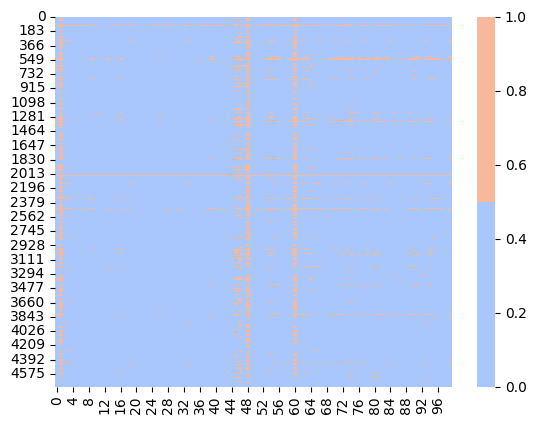

In [5]:
## plot new_tensor using seaborn with different colors for 0 and 1
import seaborn as sns

sns.heatmap(new_tensor, cmap=sns.color_palette("coolwarm", 2))

In [1]:
import pandas as pd 

gs_lf = pd.read_csv('data/datasets/NaNs_GS_LF_isomeric_SMILES_dedup_odor_filtered.csv')
gs_lf

,IsomericSMILES,Stimulus,bland,chemical,rummy,vetiver,orangeflower,lactonic,jammy,raspberry,...,musk,vegetable,grassy,orange,hay,sour,sulfurous,apple,CID,MolecularWeight
0,CC(=O)C1=CC=C(C=C1)OC,100-06-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,1,0,0,0,7476.0,150.17
1,COC1=CC=C(C=C1)C(=O)O,100-09-4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,7478.0,152.15
2,C=CC1=CC=CC=C1,100-42-5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,7501.0,104.15
3,C1=CC=C(C=C1)CO,100-51-6,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,244.0,108.14
4,C1=CC=C(C=C1)C=O,100-52-7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,240.0,106.12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5857,CCC1CSSSC1(CC)CC,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,154241350.0,222.40
5858,CC(S)SS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,1,0,155323379.0,126.30
5859,CCC(C)C(=S)OCC(C)C,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,1,0,158699780.0,174.31
5860,CCCCCCCC=COC(=O)CCC,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,161504856.0,212.33


In [125]:
fruity_idx = gs_lf[gs_lf['fruity'] == 1].index
fruity_idx.shape

(2051,)

In [126]:
## Grab every row where value of column 'pungent' is 1
pungent_idx = gs_lf[gs_lf['pungent'] == 1].index

In [127]:
pungent_idx.shape

(201,)

In [128]:
fishy_idx = gs_lf[gs_lf['fishy'] == 1].index

In [38]:
fishy_idx.shape

(75,)

In [118]:
vanilla_idx = gs_lf[gs_lf['vanilla'] == 1].index

In [119]:
creamy_idx = gs_lf[gs_lf['creamy'] == 1].index

In [120]:
sweet_idx = gs_lf[gs_lf['sweet'] == 1].index

In [121]:
vanilla_creamy_idx = vanilla_idx.intersection(creamy_idx)
vanilla_creamy_idx

Index([ 175,  286,  300,  510,  533,  540,  552,  553,  554,  577,  622,  724,
        847, 1266, 1363, 1380, 2010, 2096, 2291, 2397, 2411, 2538, 2539, 3123,
       3215, 3504, 3539, 3540, 3716, 4203, 4266, 4287, 4966, 5501],
      dtype='int64')

In [116]:
## intersection of two index, fishy_idx and pungent_idx
fishy_sulforous_idx = fishy_idx.intersection(sulforous_idx)
sulforous_idx

Index([   5,    7,   19,   65,  149,  241,  245,  266,  299,  322,
       ...
       5820, 5828, 5840, 5841, 5842, 5852, 5853, 5856, 5858, 5859],
      dtype='int64', length=410)

In [45]:
logits_path = 'data/datasets/GS_LF_400_ORs_logits.pt'
OR_logits = torch.load(logits_path)

OR_logits[pungent_idx]

tensor([[ 0.3666,  2.3038, -0.0234,  ..., -1.0462, -0.1425, -1.5981],
        [ 2.0942,  2.8149,  0.1802,  ..., -0.0221, -0.2614, -1.2332],
        [-3.8662,  1.0731, -1.4370,  ..., -8.8155, -7.7058, -6.1149],
        ...,
        [ 1.7186,  2.9371, -0.7126,  ..., -1.6889, -1.5753, -2.7237],
        [ 1.0949,  2.6350,  0.1490,  ..., -0.9438,  0.1342, -1.2795],
        [ 1.3205,  2.8244, -5.2422,  ..., -3.4820, -5.6171, -8.6909]])

In [2]:
def generate_coding_plot(logits_path, idx):
    import torch
    colors = ["blue", "red"]
    import seaborn as sns

    cmap = sns.color_palette(colors)
    import matplotlib.pyplot as plt

    OR_logits = torch.load(logits_path)
    OR_logits = OR_logits[idx]
    OR_preds = torch.round(torch.sigmoid(OR_logits))
    # Create the heatmap using seaborn
    #plt.figure(figsize=(8, 6))
    # Remove intervals on x-axis and y-axis
    #plt.xticks([])
    #plt.yticks([])

    # Create a legend with binary labels
    #cbar = plt.colorbar()
    #cbar.ax.set_yticklabels(['Label 1', 'Label 2'])

    # Add a title and show the plot
    #plt.title("Binary Heatmap with Legend using Seaborn")
    #plt.show()


    sns.heatmap(OR_preds, cmap=cmap, annot=False, fmt=".2f", cbar_kws={'ticks': [0, 1]})
    
    #num_batch, batch_size, d3 = OR_preds.size()
    #OR_tensor = OR_preds.view(-1, d3)

    

In [115]:
sulforous_idx = gs_lf[gs_lf['sulfurous'] == 1].index
sulforous_idx.shape

(410,)

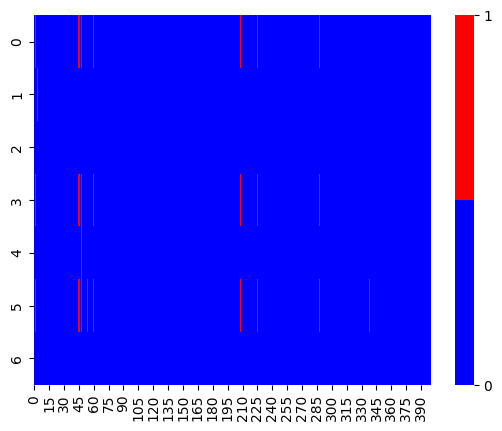

In [117]:
generate_coding_plot('data/datasets/FIXED_non_weighed_GS_LF_400_ORs_logits.pt', fishy_sulforous_idx)

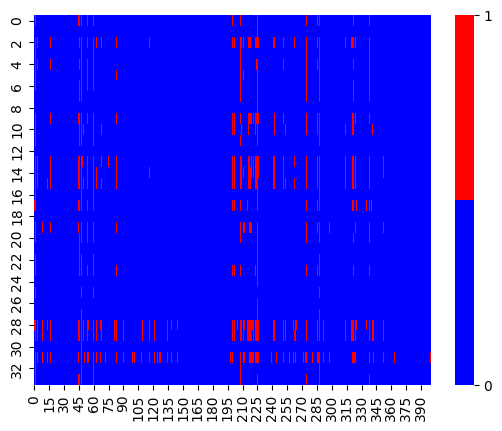

In [123]:
generate_coding_plot('data/datasets/FIXED_non_weighed_GS_LF_400_ORs_logits.pt', vanilla_creamy_idx)

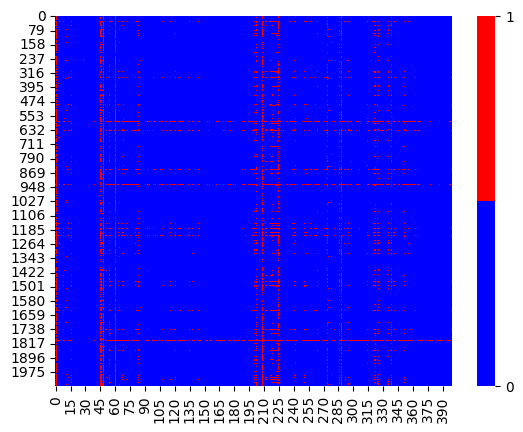

In [129]:
generate_coding_plot('data/datasets/FIXED_non_weighed_GS_LF_400_ORs_logits.pt', fruity_idx)
#xticklabels=real_receptors

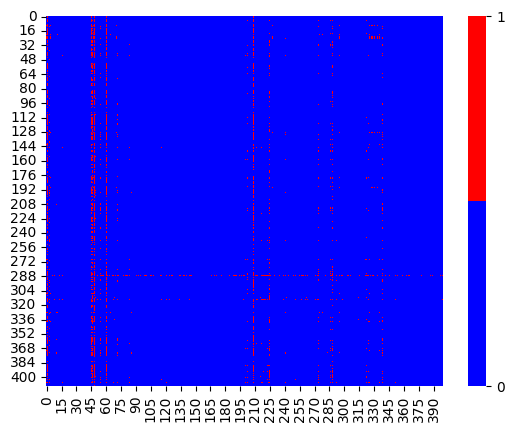

In [168]:
generate_coding_plot('data/datasets/FIXED_non_weighed_GS_LF_400_ORs_logits.pt', sulforous_idx)


In [17]:
mol_OR = pd.read_csv('data/datasets/M2OR_original_mol_OR_pairs.csv', sep = ';')
mol_OR

,mol_id,seq_id,Responsive,_DataQuality,num_unique_value_screen,canonicalSMILES,mutated_Sequence
0,m_0,s_29,1,ec50,NaN,CC1=CCC(CC1)C(=C)C,MRENNQSSTLEFILLGVTGQQEQEDFFYILFLFIYPITLIGNLLIV...
1,m_0,s_449,1,ec50,NaN,CC1=CCC(CC1)C(=C)C,MDQSNYSSLHGFILLGFSNHPKMEMILSGVVAIFYLITLVGNTAII...
2,m_0,s_539,0,ec50,NaN,CC1=CCC(CC1)C(=C)C,MDQSNYSSLHGFILLGFSNHPKMEMILSGVVAIFYLITLVGNTAII...
3,m_1,s_1,1,ec50,NaN,CC1=CCC(CC1=O)C(=C)C,MTEDNYSLTTEFILIGFSDHPDLKILLFLVLSTIYLVTMVGNLGLV...
4,m_1,s_1051,0,ec50,NaN,CC1=CCC(CC1=O)C(=C)C,MREENESSTTDFTLLGVTRQREQEYFFFILFLFIYPITVFGNMLII...
...,...,...,...,...,...,...,...
46558,m_99,s_443,1,secondaryScreening,4.0,C1=CC=C(C=C1)OC2=CC=CC=C2,MRENNQSSTLEFILLGVTGQQEQEDFFYILFLFIYPITLIGNLLIV...
46559,m_99,s_444,0,secondaryScreening,4.0,C1=CC=C(C=C1)OC2=CC=CC=C2,MRENNQSSTLEFILLGVTGQQEQEDFFYILFLFIYPITLIGNLLIV...
46560,m_99,s_449,0,secondaryScreening,4.0,C1=CC=C(C=C1)OC2=CC=CC=C2,MDQSNYSSLHGFILLGFSNHPKMEMILSGVVAIFYLITLVGNTAII...
46561,m_99,s_450,0,secondaryScreening,4.0,C1=CC=C(C=C1)OC2=CC=CC=C2,MDEANHSVVSEFVFLGLSDSRKIQLLLFLFFSVFYVSSLMGNLLIV...


In [18]:
mol_OR['_DataQuality'].value_counts()

_DataQuality
primaryScreening      33190
secondaryScreening     8158
ec50                   5215
Name: count, dtype: int64

In [23]:
gs_lf.columns.tolist()

['IsomericSMILES',
 'Stimulus',
 'bland',
 'chemical',
 'rummy',
 'vetiver',
 'orangeflower',
 'lactonic',
 'jammy',
 'raspberry',
 'minty',
 'cooked',
 'estery',
 'amber',
 'terpenic',
 'bergamot',
 'marine',
 'celery',
 'jasmin',
 'cedar',
 'natural',
 'cooling',
 'juicy',
 'geranium',
 'muguet',
 'weedy',
 'hawthorn',
 'mild',
 'brown',
 'lavender',
 'acidic',
 'clean',
 'ozone',
 'bready',
 'anise',
 'lily',
 'mentholic',
 'clove',
 'peppery',
 'sandalwood',
 'powdery',
 'cortex',
 'hyacinth',
 'soapy',
 'jasmine',
 'IUPACName',
 'name',
 'apricot',
 'herbal',
 'chamomile',
 'spicy',
 'honey',
 'cheesy',
 'popcorn',
 'ketonic',
 'phenolic',
 'musty',
 'aromatic',
 'pungent',
 'coffee',
 'alliaceous',
 'balsamic',
 'leathery',
 'hazelnut',
 'cucumber',
 'radish',
 'tropical',
 'tobacco',
 'cabbage',
 'potato',
 'metallic',
 'cinnamon',
 'tea',
 'odorless',
 'fatty',
 'winey',
 'chicken',
 'strawberry',
 'berry',
 'orris',
 'milky',
 'buttery',
 'ripe',
 'chocolate',
 'fishy',
 'anis

In [23]:
## check if row in column name contains 'vanillin' in part of the string
gs_lf[gs_lf['name'].str.contains('vanillin')].name

553                 vanillin
1363    vanillin isobutyrate
1380       dehydrodivanillin
2392           glucovanillin
2819            homovanillin
4203        vanillin acetate
Name: name, dtype: object

In [27]:
## Drop the following columns ['IsomericSMILES', 'Stimulus', 'CID', 'MolecularWeight']
gs_lf = gs_lf.drop(['IsomericSMILES', 'Stimulus', 'CID', 'MolecularWeight'], axis=1)
gs_lf.columns

Index(['bland', 'chemical', 'rummy', 'vetiver', 'orangeflower', 'lactonic',
       'jammy', 'raspberry', 'minty', 'cooked',
       ...
       'tomato', 'cherry', 'musk', 'vegetable', 'grassy', 'orange', 'hay',
       'sour', 'sulfurous', 'apple'],
      dtype='object', length=154)

In [29]:
gs_lf = gs_lf.drop(['IUPACName'], axis=1)
gs_lf.columns.tolist()

['bland',
 'chemical',
 'rummy',
 'vetiver',
 'orangeflower',
 'lactonic',
 'jammy',
 'raspberry',
 'minty',
 'cooked',
 'estery',
 'amber',
 'terpenic',
 'bergamot',
 'marine',
 'celery',
 'jasmin',
 'cedar',
 'natural',
 'cooling',
 'juicy',
 'geranium',
 'muguet',
 'weedy',
 'hawthorn',
 'mild',
 'brown',
 'lavender',
 'acidic',
 'clean',
 'ozone',
 'bready',
 'anise',
 'lily',
 'mentholic',
 'clove',
 'peppery',
 'sandalwood',
 'powdery',
 'cortex',
 'hyacinth',
 'soapy',
 'jasmine',
 'name',
 'apricot',
 'herbal',
 'chamomile',
 'spicy',
 'honey',
 'cheesy',
 'popcorn',
 'ketonic',
 'phenolic',
 'musty',
 'aromatic',
 'pungent',
 'coffee',
 'alliaceous',
 'balsamic',
 'leathery',
 'hazelnut',
 'cucumber',
 'radish',
 'tropical',
 'tobacco',
 'cabbage',
 'potato',
 'metallic',
 'cinnamon',
 'tea',
 'odorless',
 'fatty',
 'winey',
 'chicken',
 'strawberry',
 'berry',
 'orris',
 'milky',
 'buttery',
 'ripe',
 'chocolate',
 'fishy',
 'anisic',
 'sharp',
 'oily',
 'violet',
 'warm',
 '

In [31]:
## Grab indices of rows where there is only one 1
gs_lf
#individual_mols_idx = np.where(np.sum(gs_lf, axis=1) == 1)[0]

,bland,chemical,rummy,vetiver,orangeflower,lactonic,jammy,raspberry,minty,cooked,...,tomato,cherry,musk,vegetable,grassy,orange,hay,sour,sulfurous,apple
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,1,0,0,0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,1,0,0,0,0,0,0,0,0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
3,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5857,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
5858,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,1,0
5859,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,1,0
5860,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0


In [39]:
#lst_mols = 'vanillin'

vanillin = gs_lf[gs_lf['name'] == 'vanillin'].index[0]

553

In [43]:
linalool = gs_lf[gs_lf['name'] == 'linalool'].index[0]

In [44]:
isoamyl_acetate = gs_lf[gs_lf['name'] == 'isoamyl acetate'].index[0]

In [47]:
geraniol = gs_lf[gs_lf['name'] == 'geraniol'].index[0]

In [107]:
lst_pleasant = ['vanillin', 'linalool', 'isoamyl acetate', 'geraniol',
                 "limonene", "benzaldehyde", "methyl anthranilate", "eugenol",
                "citral", "farnesol", "nerol", "menthol"]

In [108]:
lst_pleasant_idx = []
for mol in lst_pleasant:
    print(mol)
    lst_pleasant_idx.append(gs_lf[gs_lf['name'] == mol].index[0])

vanillin
linalool
isoamyl acetate
geraniol
limonene
benzaldehyde
methyl anthranilate
eugenol
citral
farnesol
nerol
menthol


In [109]:
lst_unpleasant = ["indole", "butyric acid", "valeric acid",
   "putrescine", "hydrogen sulfide", "dimethyl disulfide", "isovaleric acid",
   "acetic acid", "propionic acid", "ammonia",
   "pyridine", "trimethylamine", "dimethylamine"]

In [110]:
lst_unpleasant_idx = []
for mol in lst_unpleasant:
    print(mol)
    lst_unpleasant_idx.append(gs_lf[gs_lf['name'] == mol].index[0])

indole
butyric acid
valeric acid
putrescine
hydrogen sulfide
dimethyl disulfide
isovaleric acid
acetic acid
propionic acid
ammonia
pyridine
trimethylamine
dimethylamine


In [88]:
OR_logits[12:, :]

tensor([[-0.8274,  0.8255, -4.0136,  ..., -4.6138, -4.7088, -4.1969],
        [-0.9857,  1.0463, -3.1490,  ..., -3.5689, -3.2101, -2.5526],
        [-0.7557,  3.0495, -2.2175,  ..., -0.7379, -0.6197,  0.9182],
        ...,
        [-0.8538,  2.9990, -3.5162,  ..., -4.3691, -4.7214, -3.8100],
        [-3.0471, -0.5391, -3.8383,  ..., -4.6960, -5.1382, -4.2890],
        [-1.4661,  2.7131, -3.7193,  ..., -3.8925, -3.8329, -3.1937]])

In [160]:
floral = gs_lf[gs_lf['floral'] == 1].index

In [161]:
woody = gs_lf[gs_lf['woody'] == 1].index

In [162]:
minty = gs_lf[gs_lf['minty'] == 1].index

In [163]:
## find the intersection of floral, woody and minty 
odor_fam_floral = minty.intersection(floral)
odor_fam_floral = odor_fam_floral.intersection(woody)

In [164]:
odor_fam_floral

Index([1531, 1674, 2261, 2376, 2743, 2832, 3094, 3532, 3775, 4216], dtype='int64')

In [165]:
nutty = gs_lf[gs_lf['nutty'] == 1].index
roasted = gs_lf[gs_lf['roasted'] == 1].index
meaty = gs_lf[gs_lf['meaty'] == 1].index

In [166]:
odor_fam_nutty = nutty.intersection(roasted)
odor_fam_nutty = odor_fam_nutty.intersection(meaty)
odor_fam_nutty

Index([ 378,  810,  867, 1056, 1130, 1206, 1361, 1517, 1537, 1570, 1634, 1758,
       1802, 2018, 2086, 2099, 2100, 2224, 2226, 2938, 3241, 3332, 3342, 3343,
       3451, 3748, 3928, 4113, 4114, 4373, 4374, 4380, 4815, 4827, 5031, 5072,
       5213, 5239, 5241],
      dtype='int64')

In [167]:
citrus = gs_lf[gs_lf['citrus'] == 1].index
waxy = gs_lf[gs_lf['waxy'] == 1].index
fatty = gs_lf[gs_lf['fatty'] == 1].index

odor_fam_citrus= citrus.intersection(waxy)
odor_fam_citrus = odor_fam_citrus.intersection(fatty)
odor_fam_citrus

Index([ 168,  344,  394,  397,  423,  426,  435,  436,  437,  438,  636,  637,
        638,  694,  903,  965,  973, 1143, 1226, 1228, 1263, 1277, 1296, 1445,
       1815, 1821, 1921, 1979, 2160, 2197, 2376, 2403, 2502, 2599, 2877, 3275,
       3389, 3660, 3835, 3873, 3963, 4301, 5268, 5312, 5334, 5472, 5504, 5505,
       5610],
      dtype='int64')

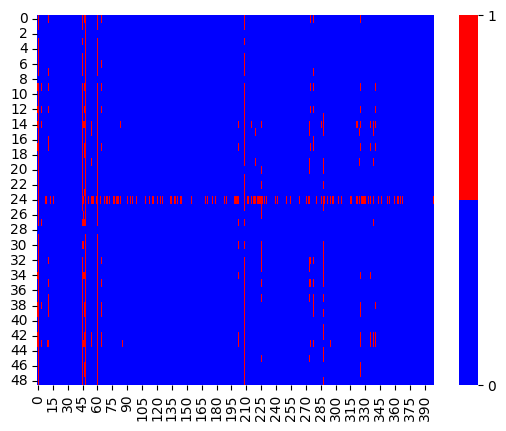

In [169]:
generate_coding_plot('data/datasets/FIXED_non_weighed_GS_LF_400_ORs_logits.pt', odor_fam_citrus)


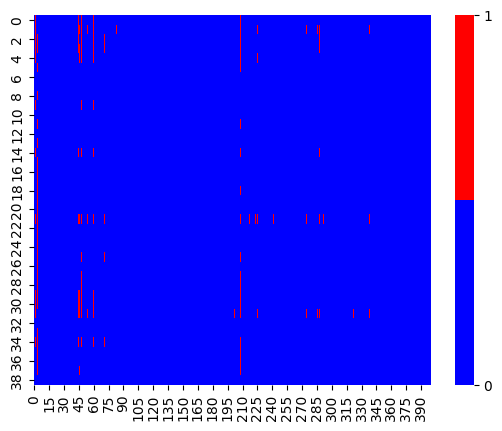

In [170]:
generate_coding_plot('data/datasets/FIXED_non_weighed_GS_LF_400_ORs_logits.pt', odor_fam_nutty)


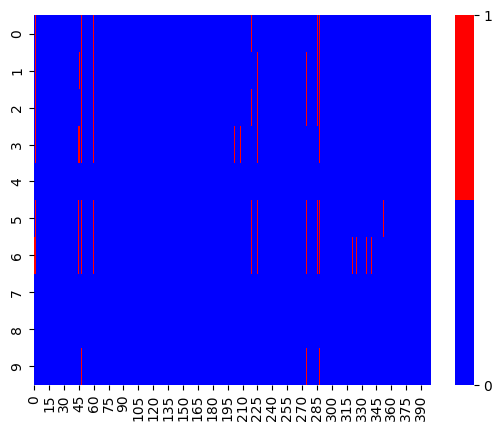

In [171]:
generate_coding_plot('data/datasets/FIXED_non_weighed_GS_LF_400_ORs_logits.pt', odor_fam_floral)


In [172]:
balsamic = gs_lf[gs_lf['balsamic'] == 1].index
spicy = gs_lf[gs_lf['spicy'] == 1].index

odor_fam_spicy = balsamic.intersection(spicy)

odor_fam_spicy

Index([  14,   49,   89,   95,  100,  102,  103,  128,  129,  164,  300,  452,
        495,  507,  510,  532,  574,  577,  578,  583,  588,  590,  612,  769,
        800,  896, 1185, 1249, 1250, 1385, 1607, 1726, 1767, 2196, 2202, 2286,
       2352, 2400, 2531, 2567, 2573, 2691, 2776, 2803, 2831, 2940, 3024, 3105,
       3123, 3128, 3161, 3272, 3318, 3515, 3620, 3644, 3830, 3878, 3923, 3980,
       4027, 4161, 4172, 4201, 4316, 4866, 4974, 5299, 5342, 5347, 5348, 5396,
       5475, 5747, 5769],
      dtype='int64')

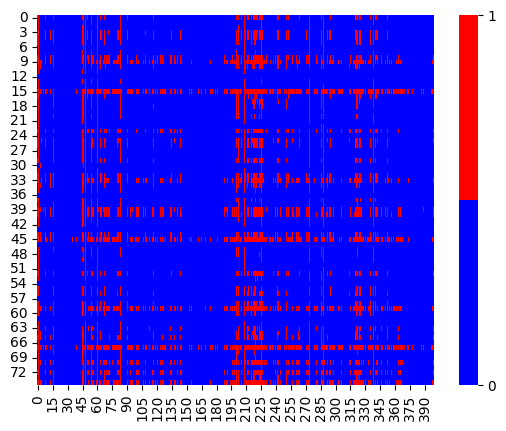

In [182]:
generate_coding_plot('data/datasets/FIXED_non_weighed_GS_LF_400_ORs_logits.pt', odor_fam_spicy)


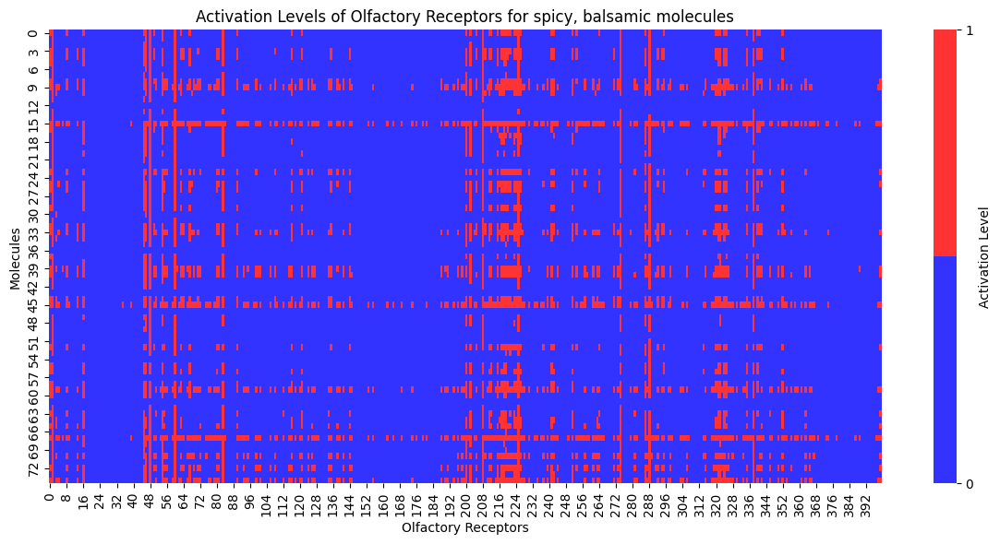

In [179]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import torch

# Define the activation levels, molecule names, and receptor names
num_molecules = 32
num_receptors = 10
#activation_levels = np.random.rand(num_molecules, num_receptors)

# ... (rest of your code)
OR_logits = torch.load('data/datasets/FIXED_non_weighed_GS_LF_400_ORs_logits.pt')
OR_logits = OR_logits[odor_fam_spicy]
OR_preds = torch.round(torch.sigmoid(OR_logits))


# Define color map with two colors for 0 and 1 values
spicy_cmap = sns.color_palette([(0.2, 0.2, 1), (1, 0.2, 0.2)])

# Create a figure and axis with stretched width
fig, ax = plt.subplots(figsize=(12, 6))  # Adjust the width value as needed

# Plot the heatmap
heatmap = sns.heatmap(OR_preds, cmap=spicy_cmap, ax=ax)
#ax.set_yticks(np.arange(len(molecules[:12])))
#ax.set_yticklabels(molecules[:12])
ax.set_ylabel("Molecules")
#ax.set_xticks(np.arange(len(real_receptors)))
#ax.set_xticklabels(real_receptors, rotation=90)
ax.set_xlabel("Olfactory Receptors")

# Add colorbar
cbar = ax.collections[0].colorbar
cbar.set_ticks([0, 1])
cbar.set_label('Activation Level')

# Set the title and layout
plt.title("Activation Levels of Olfactory Receptors for spicy, balsamic molecules")
plt.tight_layout()
plt.show()


In [183]:
vanilla_creamy_idx

Index([ 175,  286,  300,  510,  533,  540,  552,  553,  554,  577,  622,  724,
        847, 1266, 1363, 1380, 2010, 2096, 2291, 2397, 2411, 2538, 2539, 3123,
       3215, 3504, 3539, 3540, 3716, 4203, 4266, 4287, 4966, 5501],
      dtype='int64')

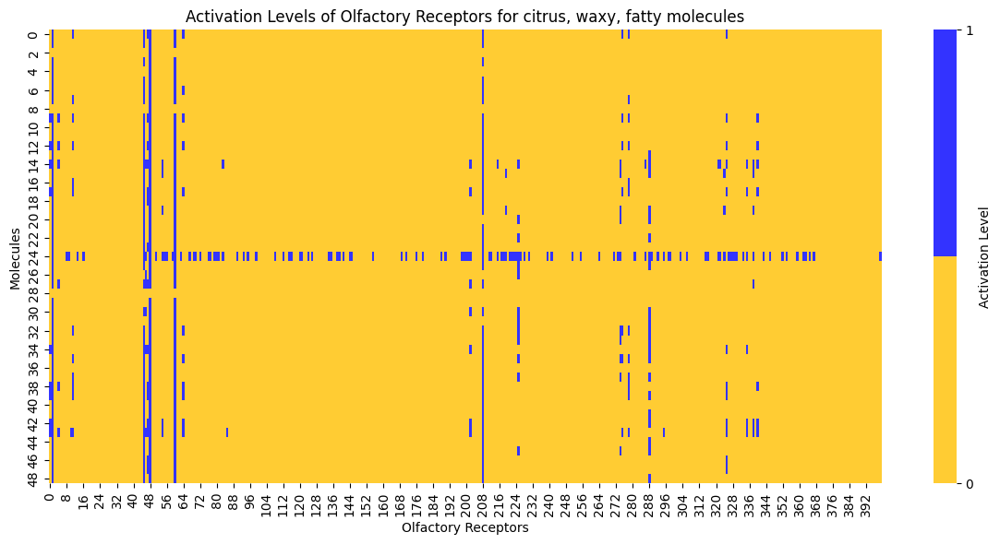

In [187]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import torch

# Define the activation levels, molecule names, and receptor names
num_molecules = 32
num_receptors = 10
#activation_levels = np.random.rand(num_molecules, num_receptors)

# ... (rest of your code)
OR_logits = torch.load('data/datasets/FIXED_non_weighed_GS_LF_400_ORs_logits.pt')
OR_logits = OR_logits[odor_fam_citrus]
OR_preds = torch.round(torch.sigmoid(OR_logits))


# Define color map with two colors for 0 and 1 values
spicy_cmap = sns.color_palette([(1, 0.8, 0.2), (0.2, 0.2, 1)])

# Create a figure and axis with stretched width
fig, ax = plt.subplots(figsize=(12, 6))  # Adjust the width value as needed

# Plot the heatmap
heatmap = sns.heatmap(OR_preds, cmap=spicy_cmap, ax=ax)
#ax.set_yticks(np.arange(len(molecules[:12])))
#ax.set_yticklabels(molecules[:12])
ax.set_ylabel("Molecules")
#ax.set_xticks(np.arange(len(real_receptors)))
#ax.set_xticklabels(real_receptors, rotation=90)
ax.set_xlabel("Olfactory Receptors")

# Add colorbar
cbar = ax.collections[0].colorbar
cbar.set_ticks([0, 1])
cbar.set_label('Activation Level')

# Set the title and layout
plt.title("Activation Levels of Olfactory Receptors for citrus, waxy, fatty molecules")
plt.tight_layout()
plt.show()


In [213]:
OR_logits = torch.load('data/datasets/FIXED_non_weighed_GS_LF_400_ORs_logits.pt')
#OR_logits = OR_logits[vanilla_creamy_idx]
OR_preds = torch.round(torch.sigmoid(OR_logits))

c = 0

low_OR_vanilla_creamy_idx = []

for idx in vanilla_creamy_idx:
    #print(gs_lf.loc[idx, 'name'])
    ## get number of 1s in row of OR_preds
    if OR_preds[idx].sum().item() < 15 and OR_preds[idx].sum().item() >= 2:
        low_OR_vanilla_creamy_idx.append(idx)



In [214]:
len(low_OR_vanilla_creamy_idx)

14

In [222]:
names = gs_lf.loc[low_OR_vanilla_creamy_idx, 'name'].tolist()

In [224]:
names[11] = '2-Ethoxy-4-(4-methyl-1,3-dioxolan-2-yl)phenol'
names[9] = '2-ethoxy-4-(4,4,6-trimethyl-1,3-dioxan-2-yl)phenol'
names[6] = 'Methyl p-tert-butylphenylacetate'
names

['4-methoxybenzyl alcohol',
 'dihydrocoumarin',
 'piperonal',
 '3-ethoxy-4-hydroxybenzaldehyde',
 'vanillin',
 '4-(ethoxymethyl)-2-methoxyphenol',
 'Methyl p-tert-butylphenylacetate',
 'vanillyl alcohol',
 '2-methoxy-4-(4,4,6-trimethyl-1,3-dioxan-2-yl)phenol',
 '2-ethoxy-4-(4,4,6-trimethyl-1,3-dioxan-2-yl)phenol',
 '2,4,6-triisobutyl-1,3,5-trioxane',
 '2-Ethoxy-4-(4-methyl-1,3-dioxolan-2-yl)phenol',
 '1-ethoxy-2-methoxybenzene',
 '2-hydroxy-2-phenyl-propionic acid ethyl ester']

In [215]:
vanilla_creamy_idx.shape[0] - c

34

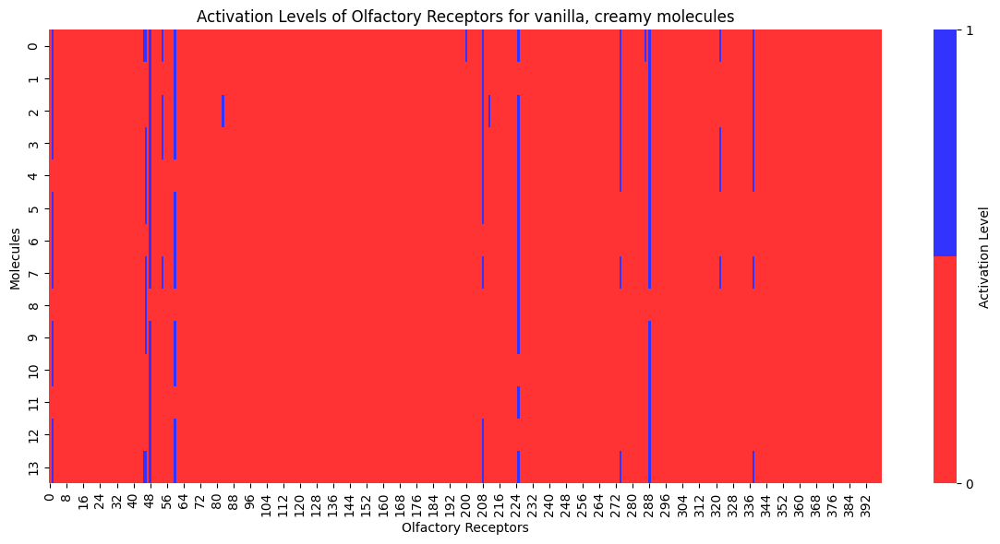

In [218]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import torch

# Define the activation levels, molecule names, and receptor names
num_molecules = 32
num_receptors = 10
#activation_levels = np.random.rand(num_molecules, num_receptors)

# ... (rest of your code)
OR_logits = torch.load('data/datasets/FIXED_non_weighed_GS_LF_400_ORs_logits.pt')
OR_logits = OR_logits[low_OR_vanilla_creamy_idx]
OR_preds = torch.round(torch.sigmoid(OR_logits))


# Define color map with two colors for 0 and 1 values
spicy_cmap = sns.color_palette([(1, 0.2, 0.2), (0.2, 0.2, 1)])

# Create a figure and axis with stretched width
fig, ax = plt.subplots(figsize=(12, 6))  # Adjust the width value as needed

# Plot the heatmap
heatmap = sns.heatmap(OR_preds, cmap=spicy_cmap, ax=ax)
#ax.set_yticks(np.arange(len(molecules[:12])))
#ax.set_yticklabels(molecules[:12])
ax.set_ylabel("Molecules")
#ax.set_xticks(np.arange(len(real_receptors)))
#ax.set_xticklabels(real_receptors, rotation=90)
ax.set_xlabel("Olfactory Receptors")

# Add colorbar
cbar = ax.collections[0].colorbar
cbar.set_ticks([0, 1])
cbar.set_label('Activation Level')

# Set the title and layout
plt.title("Activation Levels of Olfactory Receptors for vanilla, creamy molecules")
plt.tight_layout()
plt.show()

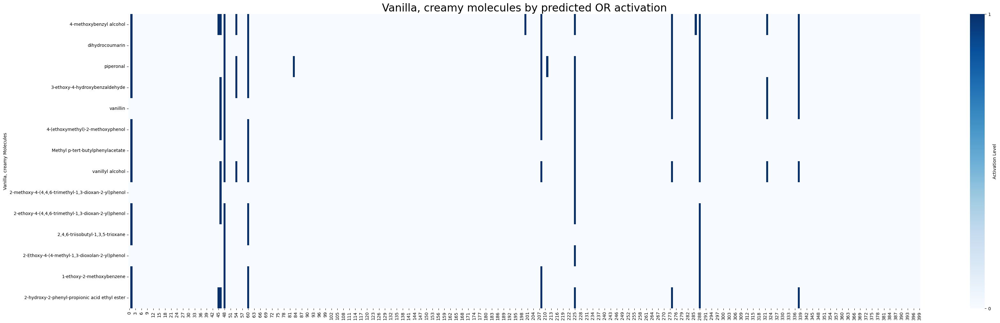

'\n# Plotting the heatmap\nfig, (ax1, ax2) = plt.subplots(nrows=2, figsize=(12, 12), sharex=True, gridspec_kw={\'height_ratios\': [15, 17]})\n\nsns.heatmap(OR_preds, cmap=pleasant_cmap, cbar=True, cbar_ax=None, cbar_kws={\'ticks\': [0, 1], \'label\': \'Activation Level\'}, yticklabels=molecules, ax=ax1)\n\n#sns.heatmap(OR_preds[2:, :], cmap=unpleasant_cmap, cbar=True, cbar_ax=None, cbar_kws={\'ticks\': [0, 1], \'label\': \'Activation Level\'}, yticklabels=molecules[2:], ax=ax2)\n\n#plt.suptitle("Activation Levels of Olfactory Receptors for Pleasant and Unpleasant Molecules")\n#plt.xlabel("Olfactory Receptors")\nax1.set_ylabel("Pleasant Molecules")\n'

In [258]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import torch
# Define the activation levels, molecule names, and receptor names
num_molecules = 32
num_receptors = 10
activation_levels = np.random.rand(num_molecules, num_receptors)

# ... (rest of your code)
OR_logits = torch.load('data/datasets/FIXED_non_weighed_GS_LF_400_ORs_logits.pt')
OR_logits = OR_logits[low_OR_vanilla_creamy_idx]
OR_preds = torch.round(torch.sigmoid(OR_logits))


#activation_levels[:15, :5] += np.random.normal(0.1, 0.1, (15, 5))
#activation_levels[15:, 5:] += np.random.normal(0.1, 0.1, (17, 5))
#activation_levels += np.random.normal(0, 0.1, activation_levels.shape)
#activation_levels = np.clip(activation_levels, 0, 1)

# Define pleasant and unpleasant molecules
molecules = names
real_receptors = [i for i in range(400)]

# Define color palettes
pleasant_cmap = sns.color_palette("Blues", as_cmap=True)
unpleasant_cmap = sns.color_palette("Reds", as_cmap=True)

#pleasant_cmap = sns.color_palette([(0.2, 0.2, 1), (1, 0.2, 0.2)])
#unpleasant_cmap = sns.color_palette([(0.8, 0.8, 1), (1, 0.8, 0.8)])

# Plotting the heatmap
fig, ax1 = plt.subplots(figsize=(40, 12))

sns.heatmap(OR_preds, cmap=pleasant_cmap, cbar=True, cbar_ax=None, cbar_kws={'ticks': [0, 1], 'label': 'Activation Level'}, yticklabels=molecules, ax=ax1)

ax1.set_ylabel("Vanilla, creamy Molecules")
plt.title('Vanilla, creamy molecules by predicted OR activation', fontdict={'fontsize': 24})
plt.show()


"""
# Plotting the heatmap
fig, (ax1, ax2) = plt.subplots(nrows=2, figsize=(12, 12), sharex=True, gridspec_kw={'height_ratios': [15, 17]})

sns.heatmap(OR_preds, cmap=pleasant_cmap, cbar=True, cbar_ax=None, cbar_kws={'ticks': [0, 1], 'label': 'Activation Level'}, yticklabels=molecules, ax=ax1)

#sns.heatmap(OR_preds[2:, :], cmap=unpleasant_cmap, cbar=True, cbar_ax=None, cbar_kws={'ticks': [0, 1], 'label': 'Activation Level'}, yticklabels=molecules[2:], ax=ax2)

#plt.suptitle("Activation Levels of Olfactory Receptors for Pleasant and Unpleasant Molecules")
#plt.xlabel("Olfactory Receptors")
ax1.set_ylabel("Pleasant Molecules")
"""

In [3]:
fruity_idx = gs_lf[gs_lf['fruity'] == 1].index


## Fruity

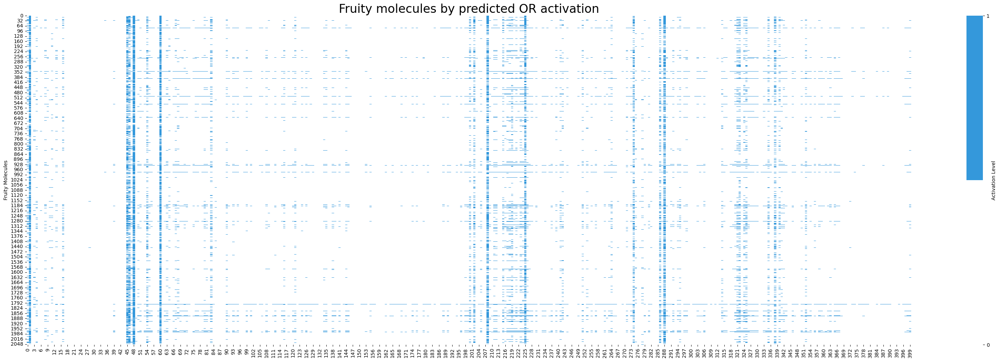

In [10]:
## fruity 

fruity_idx = gs_lf[gs_lf['fruity'] == 1].index
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import torch
# Define the activation levels, molecule names, and receptor names
num_molecules = len(fruity_idx)
num_receptors = 10
#activation_levels = np.random.rand(num_molecules, num_receptors)

# ... (rest of your code)
OR_logits = torch.load('data/datasets/FIXED_non_weighed_GS_LF_400_ORs_logits.pt')
OR_logits = OR_logits[fruity_idx]
OR_preds = torch.round(torch.sigmoid(OR_logits))


#activation_levels[:15, :5] += np.random.normal(0.1, 0.1, (15, 5))
#activation_levels[15:, 5:] += np.random.normal(0.1, 0.1, (17, 5))
#activation_levels += np.random.normal(0, 0.1, activation_levels.shape)
#activation_levels = np.clip(activation_levels, 0, 1)

# Define pleasant and unpleasant molecules
#molecules = names
real_receptors = [i for i in range(400)]

# Define color palettes
pleasant_cmap = sns.color_palette(["#ffffff", "#3498db"])  # White to blue
unpleasant_cmap = sns.color_palette("Reds", as_cmap=True)

#pleasant_cmap = sns.color_palette([(0.2, 0.2, 1), (1, 0.2, 0.2)])
#unpleasant_cmap = sns.color_palette([(0.8, 0.8, 1), (1, 0.8, 0.8)])

# Plotting the heatmap
fig, ax1 = plt.subplots(figsize=(40, 12))

sns.heatmap(OR_preds, cmap=pleasant_cmap, cbar=True, cbar_ax=None, cbar_kws={'ticks': [0, 1], 'label': 'Activation Level'}, ax=ax1)

ax1.set_ylabel("Fruity Molecules")
plt.title('Fruity molecules by predicted OR activation', fontdict={'fontsize': 24})
plt.show()


In [188]:
pd.read_csv("data/datasets/M2OR_original_mol_OR_pairs.csv", sep = ';')

,mol_id,seq_id,Responsive,_DataQuality,num_unique_value_screen,canonicalSMILES,mutated_Sequence
0,m_0,s_29,1,ec50,NaN,CC1=CCC(CC1)C(=C)C,MRENNQSSTLEFILLGVTGQQEQEDFFYILFLFIYPITLIGNLLIV...
1,m_0,s_449,1,ec50,NaN,CC1=CCC(CC1)C(=C)C,MDQSNYSSLHGFILLGFSNHPKMEMILSGVVAIFYLITLVGNTAII...
2,m_0,s_539,0,ec50,NaN,CC1=CCC(CC1)C(=C)C,MDQSNYSSLHGFILLGFSNHPKMEMILSGVVAIFYLITLVGNTAII...
3,m_1,s_1,1,ec50,NaN,CC1=CCC(CC1=O)C(=C)C,MTEDNYSLTTEFILIGFSDHPDLKILLFLVLSTIYLVTMVGNLGLV...
4,m_1,s_1051,0,ec50,NaN,CC1=CCC(CC1=O)C(=C)C,MREENESSTTDFTLLGVTRQREQEYFFFILFLFIYPITVFGNMLII...
...,...,...,...,...,...,...,...
46558,m_99,s_443,1,secondaryScreening,4.0,C1=CC=C(C=C1)OC2=CC=CC=C2,MRENNQSSTLEFILLGVTGQQEQEDFFYILFLFIYPITLIGNLLIV...
46559,m_99,s_444,0,secondaryScreening,4.0,C1=CC=C(C=C1)OC2=CC=CC=C2,MRENNQSSTLEFILLGVTGQQEQEDFFYILFLFIYPITLIGNLLIV...
46560,m_99,s_449,0,secondaryScreening,4.0,C1=CC=C(C=C1)OC2=CC=CC=C2,MDQSNYSSLHGFILLGFSNHPKMEMILSGVVAIFYLITLVGNTAII...
46561,m_99,s_450,0,secondaryScreening,4.0,C1=CC=C(C=C1)OC2=CC=CC=C2,MDEANHSVVSEFVFLGLSDSRKIQLLLFLFFSVFYVSSLMGNLLIV...


In [293]:
#lst_unpleasant.append('trimethylamine')
lst_unpleasant_idx.append(gs_lf[gs_lf['name'] == 'formaldehyde'].index[0])

IndexError: index 0 is out of bounds for axis 0 with size 0

Bad pipe message: %s [b'\x8b\x81t)\xb6\xffyR\xdc\xf0\xa7\x08\xc4\x8a\x06+\x95\xa5 \xe0\xaed\xb3\x04\xf3d\xad\xb1\x05\x9b\xb2\x1d\x15\x8bw\x92$\xdbn\xa0\xa7E#\xf0\xd8\xf4\xc8\x9e\xbb\xab\r\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00\x0c\x00\x00\t127.0.0.1\x00\x0b\x00\x04\x03\x00\x01\x02\x00\n\x00\x0c\x00\n\x00\x1d\x00\x17\x00\x1e\x00\x19\x00\x18\x00#\x00\x00\x00\x16\x00\x00\x00\x17\x00\x00\x00\r\x00\x1e\x00\x1c\x04\x03\x05\x03\x06\x03\x08\x07\x08\x08\x08\t\x08\n\x08\x0b\x08\x04\x08\x05\x08\x06\x04\x01\x05\x01', b'\x00+\x00\x03\x02', b'\x00-']
Bad pipe message: %s [b'\xc6,mC\x86Q]\xd8\r\xee\xd2W\xc4.\x92\x1c\xf9\xb4 j:\xf8g:]\xae\x9b\x96T\xec!\x8fu\xe4.\xeef^LgE\xe3\xdb\xfb3\xea\xeaH\xfc4)\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00\x0c\x00\x00\t127.0.0.1\x00\x0b\x00\x04\x03\x00\x01\x02\x00\n\x00\x0c\x00\n\x00\x1d\x00\x17\x00', b'\x19\x00\x18\x00#\x00\x00\x00\x16\x00\x00\x00\x17\x00\x00\x00\r\x00\x1e\x00\x1c\x04\x03\x05\x03\

In [280]:
lst_unpleasant.append('4-ethyl-octanoic acid')

In [281]:
## Remove last element of lst_unpleasant
lst_unpleasant

['indole',
 'butyric acid',
 'valeric acid',
 'putrescine',
 'hydrogen sulfide',
 'dimethyl disulfide',
 'isovaleric acid',
 'acetic acid',
 'propionic acid',
 'ammonia',
 'pyridine',
 'trimethylamine',
 'dimethylamine',
 'methyl salicylate',
 'trimethylamine',
 'methanethiol',
 'dimethyl sulfide']

tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 1., 0.,  ..., 0., 0., 0.],
        [0., 1., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


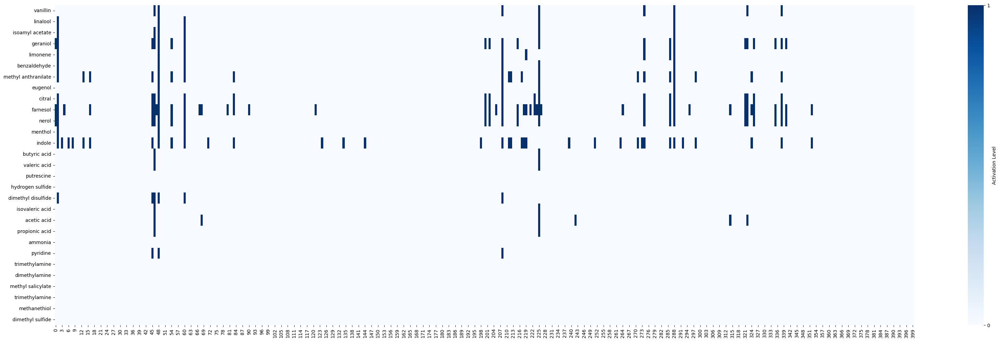

'\n# Plotting the heatmap\nfig, (ax1, ax2) = plt.subplots(nrows=2, figsize=(12, 12), sharex=True, gridspec_kw={\'height_ratios\': [15, 17]})\n\nsns.heatmap(OR_preds[:12, :], cmap=pleasant_cmap, cbar=True, cbar_ax=None, cbar_kws={\'ticks\': [0, 1], \'label\': \'Activation Level\'}, yticklabels=molecules[:12], ax=ax1)\n\nsns.heatmap(OR_preds[12:, :], cmap=unpleasant_cmap, cbar=True, cbar_ax=None, cbar_kws={\'ticks\': [0, 1], \'label\': \'Activation Level\'}, yticklabels=molecules[12:], ax=ax2)\n\n#plt.suptitle("Activation Levels of Olfactory Receptors for Pleasant and Unpleasant Molecules")\n#plt.xlabel("Olfactory Receptors")\nax1.set_ylabel("Pleasant Molecules")\nax2.set_ylabel("Unpleasant Molecules")\n#plt.tight_layout(rect=[0, 0, 1, 0.96])\n#plt.show()\n'

In [282]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import torch
# Define the activation levels, molecule names, and receptor names
num_molecules = 32
num_receptors = 10
activation_levels = np.random.rand(num_molecules, num_receptors)

molecules_idx = lst_pleasant_idx + lst_unpleasant_idx
logits_path = 'data/datasets/FIXED_non_weighed_GS_LF_400_ORs_logits.pt'
# Modify activation levels to show differences between pleasant and unpleasant smells
OR_logits = torch.load(logits_path)
OR_logits = OR_logits[molecules_idx]
OR_preds = torch.round(torch.sigmoid(OR_logits))
#OR_preds = torch.sigmoid(OR_logits)
print(OR_preds)


#activation_levels[:15, :5] += np.random.normal(0.1, 0.1, (15, 5))
#activation_levels[15:, 5:] += np.random.normal(0.1, 0.1, (17, 5))
#activation_levels += np.random.normal(0, 0.1, activation_levels.shape)
#activation_levels = np.clip(activation_levels, 0, 1)

# Define pleasant and unpleasant molecules
molecules = lst_pleasant + lst_unpleasant
real_receptors = [i for i in range(400)]

# Define color palettes
pleasant_cmap = sns.color_palette("Blues", as_cmap=True)
unpleasant_cmap = sns.color_palette("Reds", as_cmap=True)

#pleasant_cmap = sns.color_palette([(0.2, 0.2, 1), (1, 0.2, 0.2)])
#unpleasant_cmap = sns.color_palette([(0.8, 0.8, 1), (1, 0.8, 0.8)])

# Plotting the heatmap
fig, ax1 = plt.subplots(figsize=(40, 12))

sns.heatmap(OR_preds, cmap=pleasant_cmap, cbar=True, cbar_ax=None, cbar_kws={'ticks': [0, 1], 'label': 'Activation Level'}, yticklabels=molecules, ax=ax1)

#ax1.set_ylabel("Vanilla, creamy Molecules")
#plt.title('Vanilla, creamy molecules by predicted OR activation', fontdict={'fontsize': 24})
plt.show()

"""
# Plotting the heatmap
fig, (ax1, ax2) = plt.subplots(nrows=2, figsize=(12, 12), sharex=True, gridspec_kw={'height_ratios': [15, 17]})

sns.heatmap(OR_preds[:12, :], cmap=pleasant_cmap, cbar=True, cbar_ax=None, cbar_kws={'ticks': [0, 1], 'label': 'Activation Level'}, yticklabels=molecules[:12], ax=ax1)

sns.heatmap(OR_preds[12:, :], cmap=unpleasant_cmap, cbar=True, cbar_ax=None, cbar_kws={'ticks': [0, 1], 'label': 'Activation Level'}, yticklabels=molecules[12:], ax=ax2)

#plt.suptitle("Activation Levels of Olfactory Receptors for Pleasant and Unpleasant Molecules")
#plt.xlabel("Olfactory Receptors")
ax1.set_ylabel("Pleasant Molecules")
ax2.set_ylabel("Unpleasant Molecules")
#plt.tight_layout(rect=[0, 0, 1, 0.96])
#plt.show()
"""

In [263]:
gs_lf[gs_lf['name'] == 'methyl salicylate'].index[0]

506

In [232]:
## name column in gs_lf contains  2-Isobutyl-3-methoxypyrazine
gs_lf[gs_lf['name'] == '2-isobutyl-3-methoxypyrazine']

,IsomericSMILES,Stimulus,bland,chemical,rummy,vetiver,orangeflower,lactonic,jammy,raspberry,...,musk,vegetable,grassy,orange,hay,sour,sulfurous,apple,CID,MolecularWeight
1600,CC(C)CC1=NC=CN=C1OC,24683-00-9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,32594.0,166.22


In [234]:
isovaleric_acid = gs_lf[gs_lf['name'] == 'isovaleric acid'].index[0]
diethyl_disulfide = gs_lf[gs_lf['name'] == 'diethyl disulfide'].index[0]
isobutyl = gs_lf[gs_lf['name'] == '2-isobutyl-3-methoxypyrazine'].index[0]
octanoic_acid = gs_lf[gs_lf['name'] == 'octanoic acid'].index[0]
one_octen_3_ol = gs_lf[gs_lf['name'] == '1-octen-3-ol'].index[0]

two_phenylethanol = gs_lf[gs_lf['name'] == '2-phenylethanol'].index[0]
eugenol = gs_lf[gs_lf['name'] == 'eugenol'].index[0]
linalool =  gs_lf[gs_lf['name'] == 'linalool'].index[0]
ethyl_butyrate = gs_lf[gs_lf['name'] == 'ethyl butyrate'].index[0]
vanillin = gs_lf[gs_lf['name'] == 'vanillin'].index[0]

In [236]:
unpleasant_lst_idx = [isovaleric_acid, diethyl_disulfide, isobutyl, octanoic_acid, one_octen_3_ol]
pleasant_lst_idx = [two_phenylethanol, eugenol, linalool, ethyl_butyrate, vanillin]

unpleasant_lst = ['isovaleric_acid', 'diethyl_disulfide', '2-isobutyl-3-methoxypyrazine', 'octanoic_acid', '1-octen-3-ol']
pleasant_lst = ['2-phenylethanol','eugenol', 'linaool','ethyl butyrate', 'vanillin']

In [237]:
pleasant_lst_idx

[2992, 4416, 4011, 182, 553]

tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 1., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 1., 0.,  ..., 0., 0., 0.],
        [0., 1., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


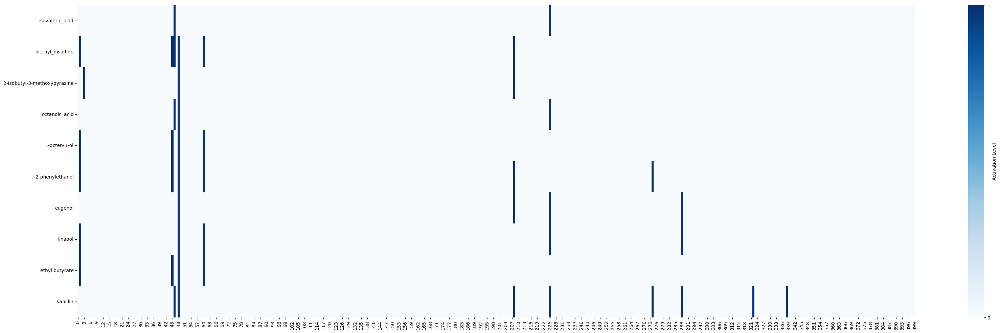

'\n\n# Plotting the heatmap\nfig, (ax2, ax1) = plt.subplots(nrows=2, figsize=(12, 12), sharex=True, gridspec_kw={\'height_ratios\': [15, 17]})\n\n\nsns.heatmap(OR_preds[5:, :], cmap=unpleasant_cmap, cbar=True, cbar_ax=None, cbar_kws={\'ticks\': [0, 1], \'label\': \'Activation Level\'}, yticklabels=molecules[5:], ax=ax2)\nsns.heatmap(OR_preds[:5, :], cmap=pleasant_cmap, cbar=True, cbar_ax=None, cbar_kws={\'ticks\': [0, 1], \'label\': \'Activation Level\'}, yticklabels=molecules[:5], ax=ax1)\n\n\n#plt.suptitle("Activation Levels of Olfactory Receptors for Pleasant and Unpleasant Molecules")\n#plt.xlabel("Olfactory Receptors")\nax1.set_ylabel("Pleasant Molecules")\nax2.set_ylabel("Unpleasant Molecules")\n#plt.tight_layout(rect=[0, 0, 1, 0.96])\n#plt.show()\n'

In [255]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import torch
# Define the activation levels, molecule names, and receptor names
num_molecules = 32
num_receptors = 10
activation_levels = np.random.rand(num_molecules, num_receptors)

molecules_idx = unpleasant_lst_idx + pleasant_lst_idx
logits_path = 'data/datasets/FIXED_non_weighed_GS_LF_400_ORs_logits.pt'
# Modify activation levels to show differences between pleasant and unpleasant smells
OR_logits = torch.load(logits_path)
OR_logits = OR_logits[molecules_idx]
OR_preds = torch.round(torch.sigmoid(OR_logits))
#OR_preds = torch.sigmoid(OR_logits)
print(OR_preds)


#activation_levels[:15, :5] += np.random.normal(0.1, 0.1, (15, 5))
#activation_levels[15:, 5:] += np.random.normal(0.1, 0.1, (17, 5))
#activation_levels += np.random.normal(0, 0.1, activation_levels.shape)
#activation_levels = np.clip(activation_levels, 0, 1)

# Define pleasant and unpleasant molecules
molecules = unpleasant_lst + pleasant_lst
real_receptors = [i for i in range(400)]

# Define color palettes
pleasant_cmap = sns.color_palette("Blues", as_cmap=True)
unpleasant_cmap = sns.color_palette("Reds", as_cmap=True)

#pleasant_cmap = sns.color_palette([(0.2, 0.2, 1), (1, 0.2, 0.2)])
#unpleasant_cmap = sns.color_palette([(0.8, 0.8, 1), (1, 0.8, 0.8)])


# Plotting the heatmap
fig, ax1 = plt.subplots(figsize=(40, 12))

sns.heatmap(OR_preds, cmap=pleasant_cmap, cbar=True, cbar_ax=None, cbar_kws={'ticks': [0, 1], 'label': 'Activation Level'}, yticklabels=molecules, ax=ax1)

#ax1.set_ylabel("Vanilla, creamy Molecules")
#plt.title('Vanilla, creamy molecules by predicted OR activation', fontdict={'fontsize': 24})
plt.show()

"""

# Plotting the heatmap
fig, (ax2, ax1) = plt.subplots(nrows=2, figsize=(12, 12), sharex=True, gridspec_kw={'height_ratios': [15, 17]})


sns.heatmap(OR_preds[5:, :], cmap=unpleasant_cmap, cbar=True, cbar_ax=None, cbar_kws={'ticks': [0, 1], 'label': 'Activation Level'}, yticklabels=molecules[5:], ax=ax2)
sns.heatmap(OR_preds[:5, :], cmap=pleasant_cmap, cbar=True, cbar_ax=None, cbar_kws={'ticks': [0, 1], 'label': 'Activation Level'}, yticklabels=molecules[:5], ax=ax1)


#plt.suptitle("Activation Levels of Olfactory Receptors for Pleasant and Unpleasant Molecules")
#plt.xlabel("Olfactory Receptors")
ax1.set_ylabel("Pleasant Molecules")
ax2.set_ylabel("Unpleasant Molecules")
#plt.tight_layout(rect=[0, 0, 1, 0.96])
#plt.show()
"""

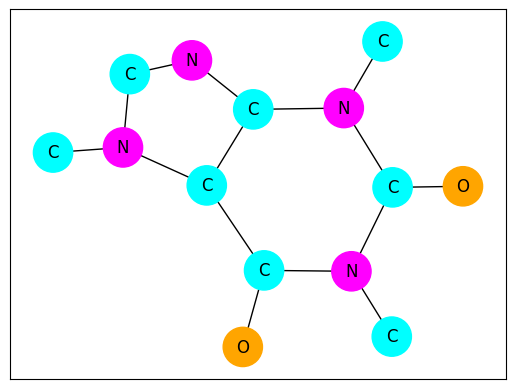

[[0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 1. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 1. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]]


Bad pipe message: %s [b'i\x7f\xa8\x86\xb4\xfe(\xe9\x9b\xa6\xc5\xca4\x99\x91[a7 $\xd9y{q\x9dCS\x19\xdcs\xa3\x01\xce\xdb\xe6\xcf\xd63\xbe\x93\xd0N\xa8A\xa4I"\x86\x1a6\xe2\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00\x0c\x00\x00\t127.0.0.1\x00\x0b\x00\x04\x03\x00\x01\x02\x00\n\x00\x0c\x00\n\x00\x1d\x00\x17\x00\x1e\x00\x19\x00\x18\x00#\x00\x00\x00\x16\x00\x00\x00\x17\x00\x00\x00\r\x00\x1e\x00\x1c\x04\x03\x05\x03\x06\x03\x08\x07\x08\x08', b'\x08\n\x08\x0b\x08\x04\x08', b'\x06\x04\x01\x05']
Bad pipe message: %s [b'']
Bad pipe message: %s [b'']
Bad pipe message: %s [b"u\xb5g\xb7f,\x91W\xb4\x85\xd9\xa4]\xac\x99f:\xfe \xfe\xcekLq}\xdf\x0c\xc8\x1bz>\x84'\xbe\x0b\xfe\x0f\xac\xc1Mz%(9\x14\x1e\x9a\xdd\xc6\xc6s\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00\x0c\x00\x00\t127.0.0.1\x00\x0b\x00\x04\x03\x00\x01\x02\x00\n\x00\x0c\x00\n\x00\x1d\x00\x17\x00\x1e\x00\x19\x00\x18\x00#\x00\x00\x00\x16\x00\x00\x00\x17\x00\x00\x00\r\x00\x1e\x00\x1c\x04\

In [25]:
# import library --------------------------------------------------------------
from rdkit import Chem
import networkx as nx
import matplotlib.pyplot as plt

# define the smiles string and covert it into a molecule sturcture ------------
caffeine_smiles = 'CN1C=NC2=C1C(=O)N(C(=O)N2C)C'
caffeine_mol = Chem.MolFromSmiles(caffeine_smiles)

# define the function for coverting rdkit object to networkx object -----------     
def mol_to_nx(mol):
    G = nx.Graph()

    for atom in mol.GetAtoms():
        G.add_node(atom.GetIdx(),
                   atomic_num=atom.GetAtomicNum(),
                   is_aromatic=atom.GetIsAromatic(),
                   atom_symbol=atom.GetSymbol())
        
    for bond in mol.GetBonds():
        G.add_edge(bond.GetBeginAtomIdx(),
                   bond.GetEndAtomIdx(),
                   bond_type=bond.GetBondType())
        
    return G

# conver rdkit object to networkx object --------------------------------------
caffeine_nx = mol_to_nx(caffeine_mol)

caffeine_atom = nx.get_node_attributes(caffeine_nx, 'atom_symbol')

color_map = {'C': 'cyan',
             'O': 'orange',
             'N': 'magenta'}  

caffeine_colors = []
for idx in caffeine_nx.nodes():
    if (caffeine_nx.nodes[idx]['atom_symbol'] in color_map):
        caffeine_colors.append(color_map[caffeine_nx.nodes[idx]['atom_symbol']])
    else:
        caffeine_colors.append('gray')
    
nx.draw_networkx(caffeine_nx,
        labels=caffeine_atom,
        with_labels = True,
        node_color=caffeine_colors,
        node_size=800)

plt.show()

# print out the adjacency matrix ---------------------------------------------- 
matrix = nx.to_numpy_matrix(caffeine_nx)
print(matrix)

## OR logits for all of GS-LF

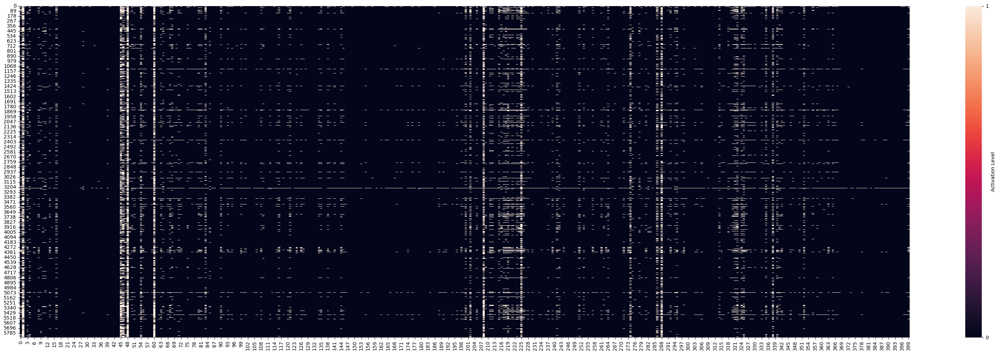

In [3]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import torch
# Define the activation levels, molecule names, and receptor names
num_molecules = 32
num_receptors = 10
activation_levels = np.random.rand(num_molecules, num_receptors)

logits_path = 'data/datasets/FIXED_non_weighed_GS_LF_400_ORs_logits.pt'
# Modify activation levels to show differences between pleasant and unpleasant smells
OR_logits = torch.load(logits_path)
#OR_logits = OR_logits[molecules_idx]
OR_preds = torch.round(torch.sigmoid(OR_logits))


fig, ax1 = plt.subplots(figsize=(40, 12))

sns.heatmap(OR_preds, cbar=True, cbar_ax=None, cbar_kws={'ticks': [0, 1], 'label': 'Activation Level'}, ax=ax1)

#ax1.set_ylabel("Vanilla, creamy Molecules")
#plt.title('Vanilla, creamy molecules by predicted OR activation', fontdict={'fontsize': 24})
plt.show()


In [ ]:
# Over 5862 compounds (row-wise), plot the distribution of the number of activations (number of 1's across row)

import seaborn as sns
import matplotlib.pyplot as plt

fig, ax1 = plt.subplots(figsize=(40, 12))
num_activations_per_compound = OR_preds.sum(axis=1)

# Plotting the distribution of the number of activations
plt.figure(figsize=(10, 6))
plt.hist(num_activations_per_compound, bins=30, color='skyblue', edgecolor='black')
plt.title('Distribution of Number of Activations per Compound')
plt.xlabel('Number of Activations')
plt.ylabel('Frequency')
plt.grid(axis='y', alpha=0.75)

plt.show()